In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg
from pathlib import Path
import matplotlib.ticker as ticker
from scipy.stats import pearsonr, spearmanr
from collections import Counter
import numpy as np

PCAM Images

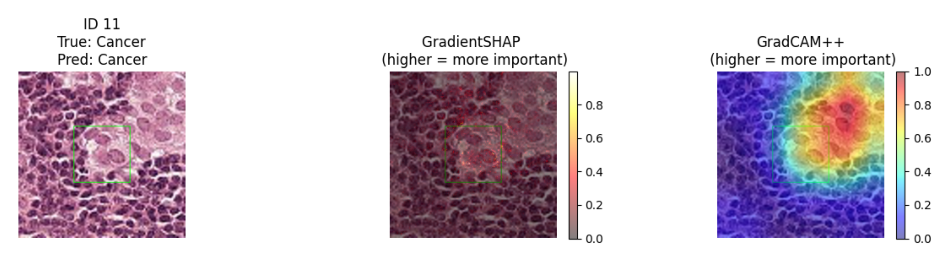

Cycle 0 images displayed.


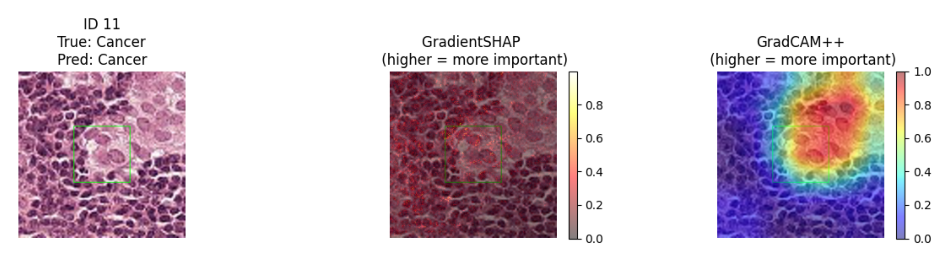

Cycle 1 images displayed.


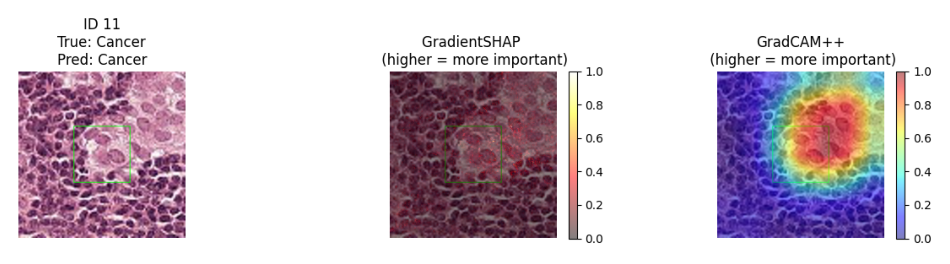

Cycle 2 images displayed.


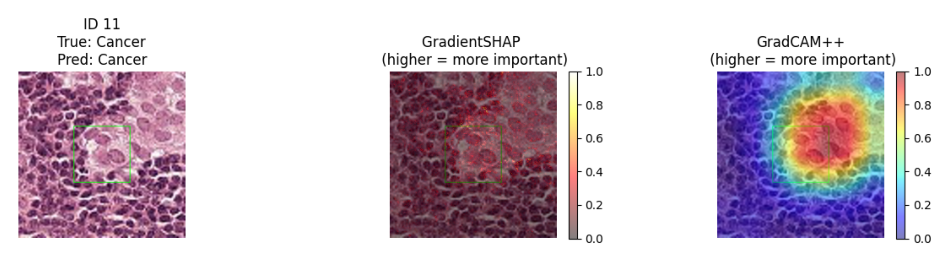

Cycle 3 images displayed.


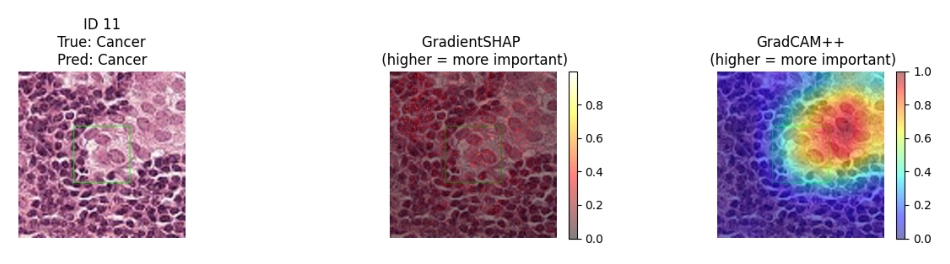

Cycle 4 images displayed.


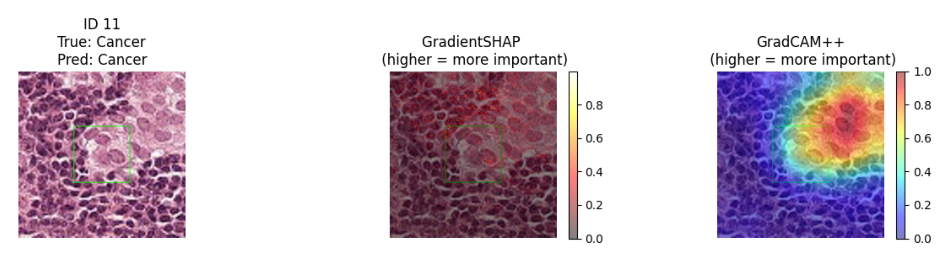

Cycle 5 images displayed.


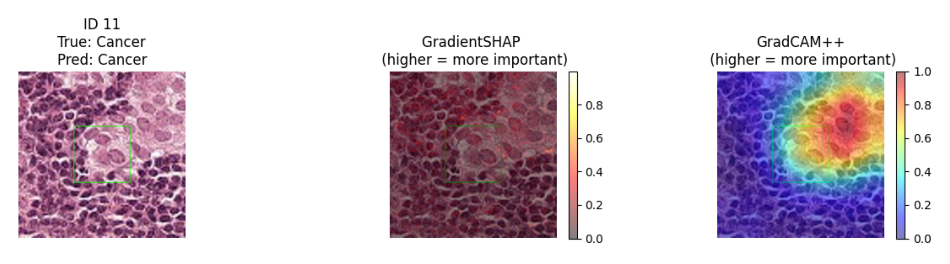

Cycle 6 images displayed.


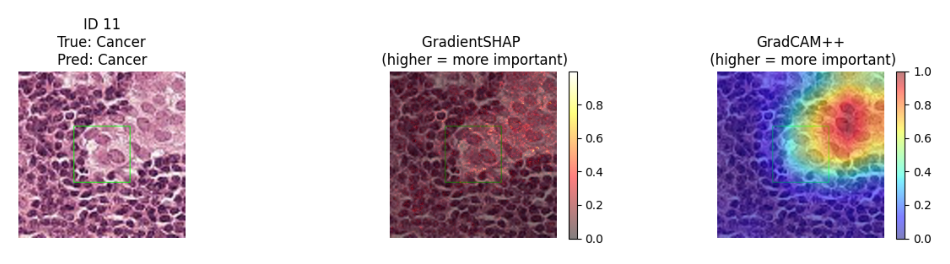

Cycle 7 images displayed.


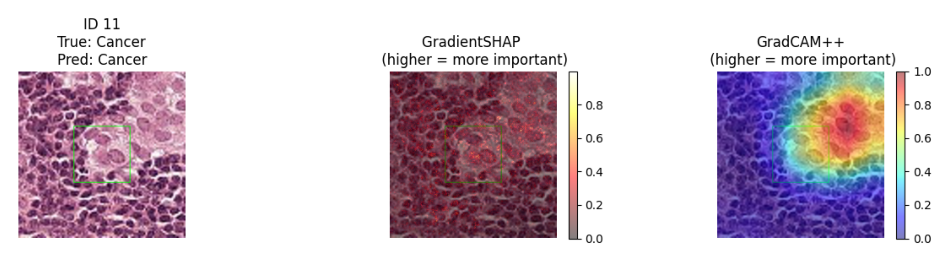

Cycle 8 images displayed.


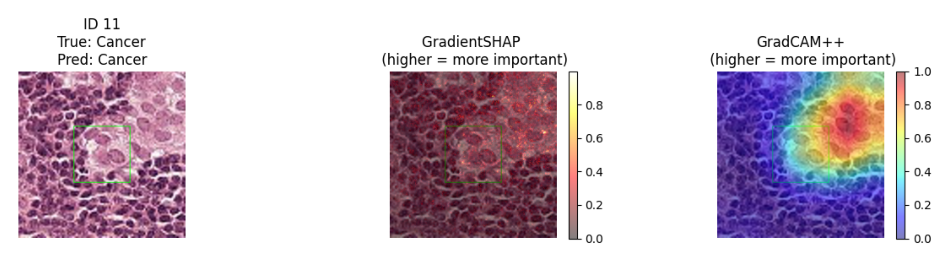

Cycle 9 images displayed.


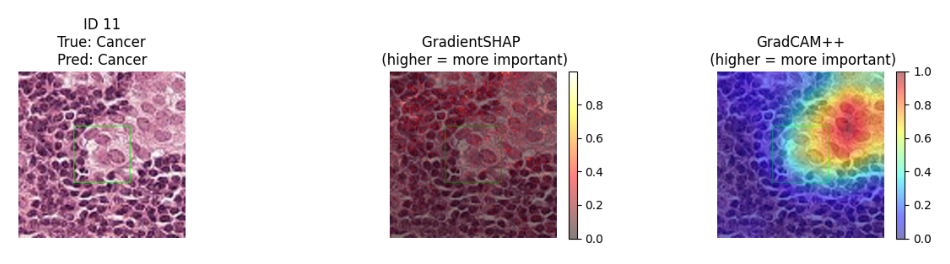

Cycle 10 images displayed.


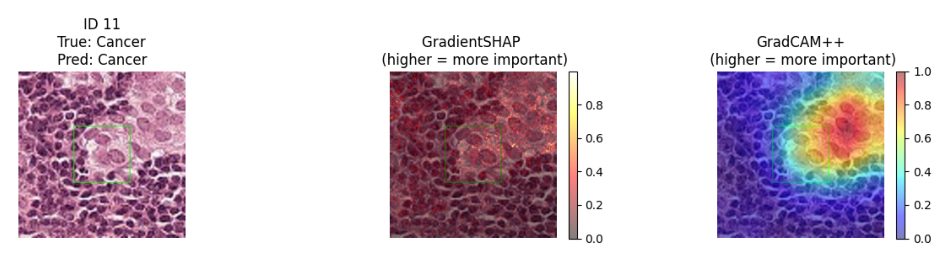

Cycle 11 images displayed.


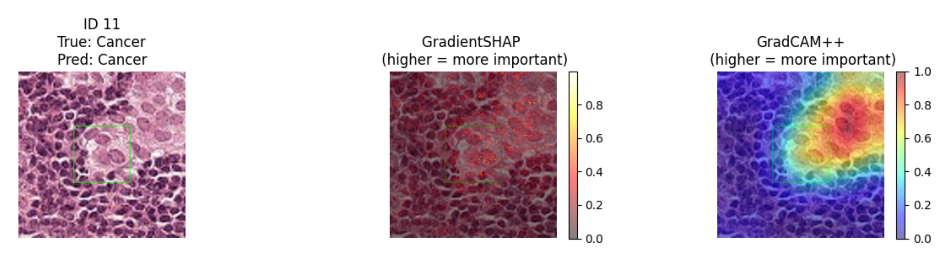

Cycle 12 images displayed.


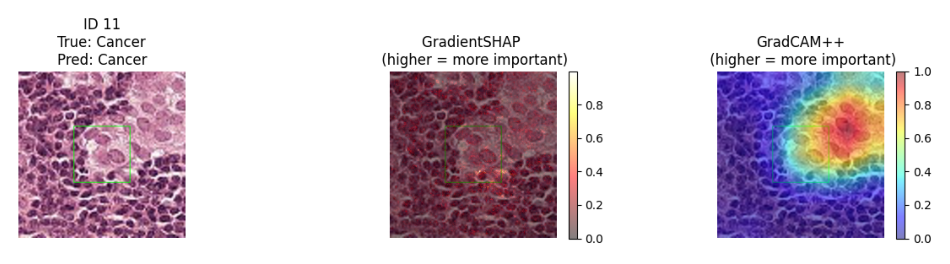

Cycle 13 images displayed.


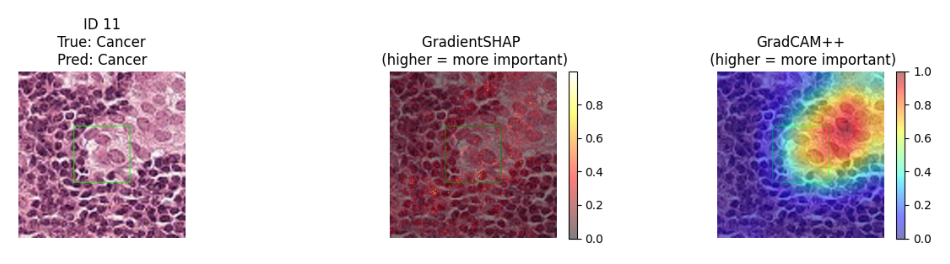

Cycle 14 images displayed.


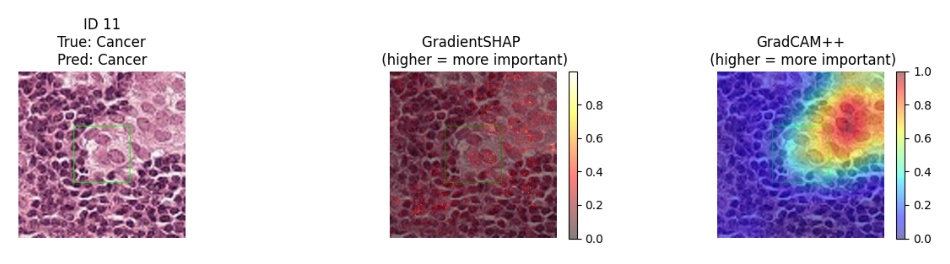

Cycle 15 images displayed.


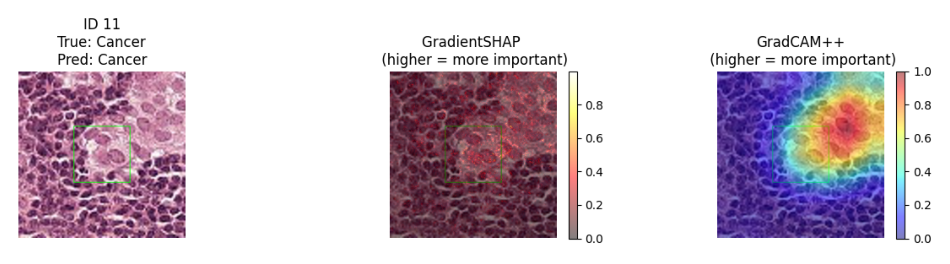

Cycle 16 images displayed.


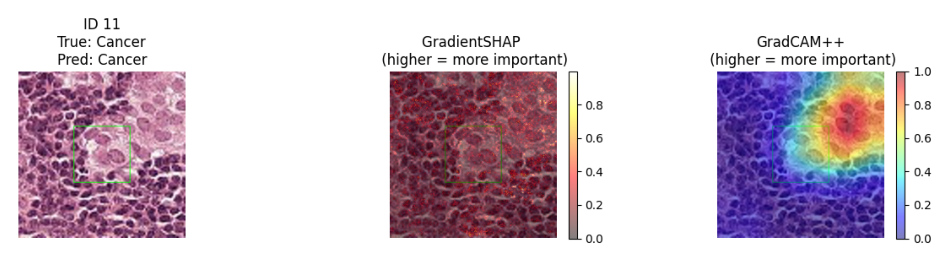

Cycle 17 images displayed.


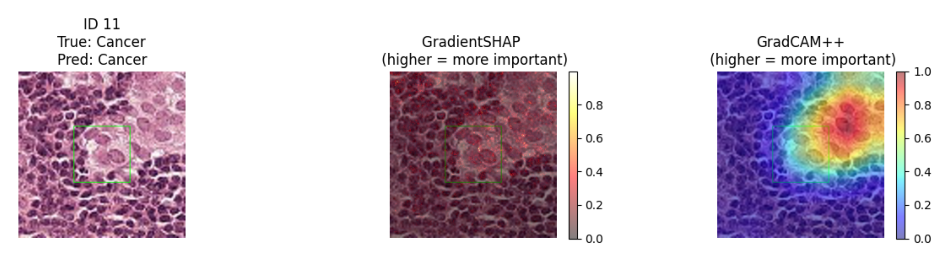

Cycle 18 images displayed.


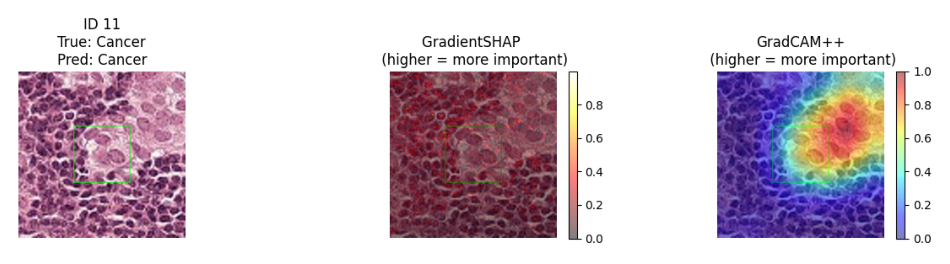

Cycle 19 images displayed.


In [ ]:
for i in range(20):
    # Replace with your actual image path
    # img_path = f'data/xai_images/pcam/one/cycle_{i}/xai_0.png'
    img_path = None  # Set to None if you don't have an image
    img_path_1 = f'data/xai_images/pcam/one/cycle_{i}/xai_11.png'
    # img_path_1 = None  # Set to None if you don't have a second image

    # Load and display the image
    if img_path is not None:
        img = mpimg.imread(img_path)
        plt.figure(figsize=(12, 12))
        plt.imshow(img)
        # plt.title(f"imaege: {img_path}")
        plt.axis('off')
        plt.show()
    if img_path_1 != None:
        img_1 = mpimg.imread(img_path_1)
        plt.figure(figsize=(12, 12))        
        plt.imshow(img_1)
        # plt.title(f"imaege: {img_path_1}")  
        plt.axis('off')
        plt.show()
    print(f"Cycle {i} images displayed.")

CIFAR Images

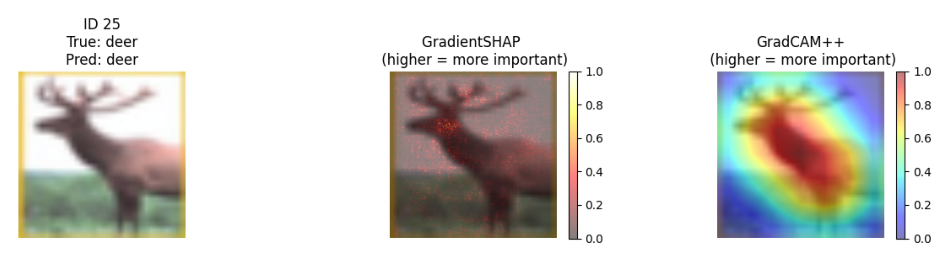

Cycle 0 images displayed.


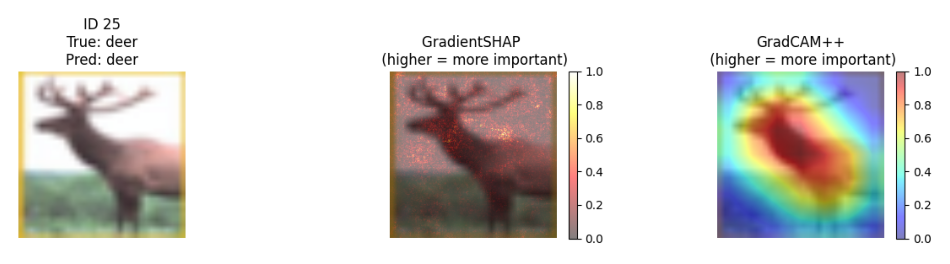

Cycle 1 images displayed.


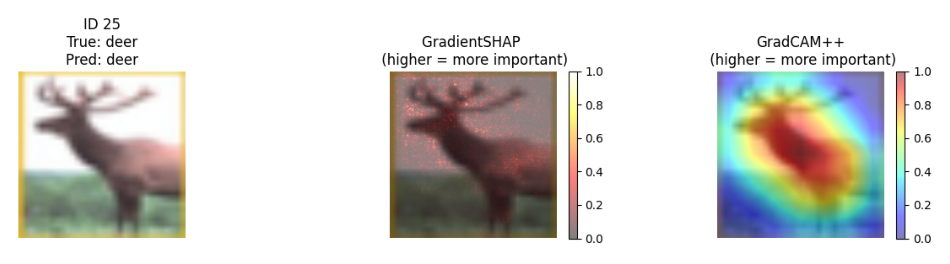

Cycle 2 images displayed.


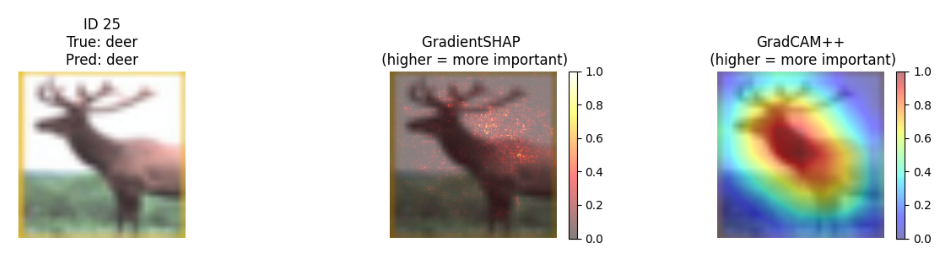

Cycle 3 images displayed.


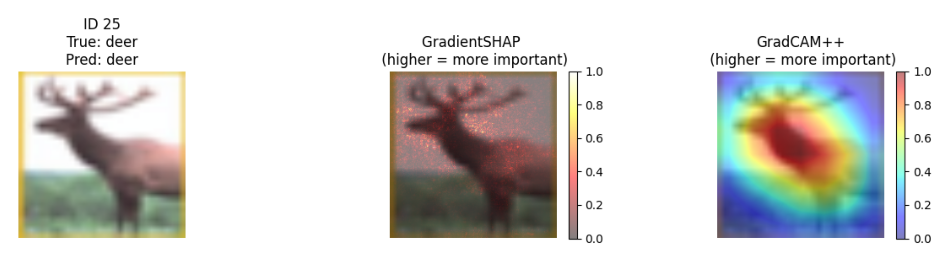

Cycle 4 images displayed.


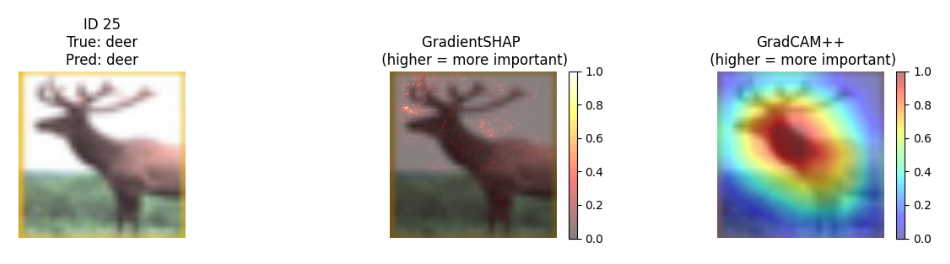

Cycle 5 images displayed.


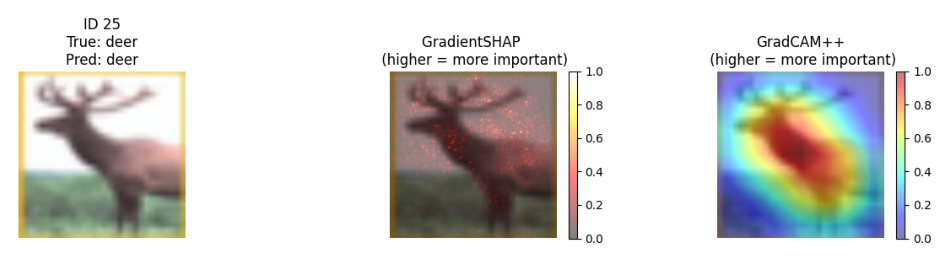

Cycle 6 images displayed.


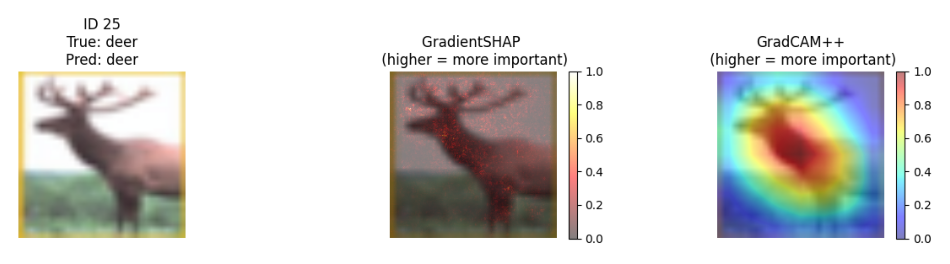

Cycle 7 images displayed.


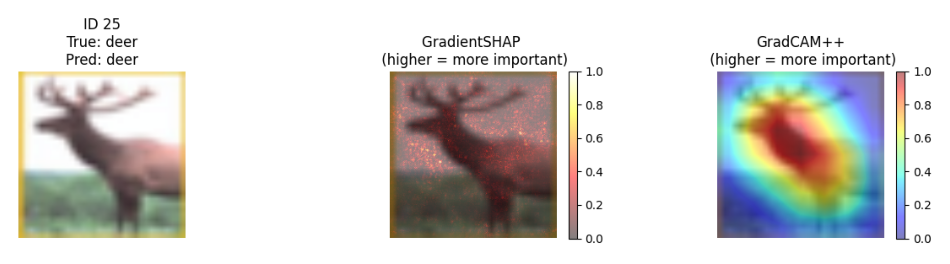

Cycle 8 images displayed.


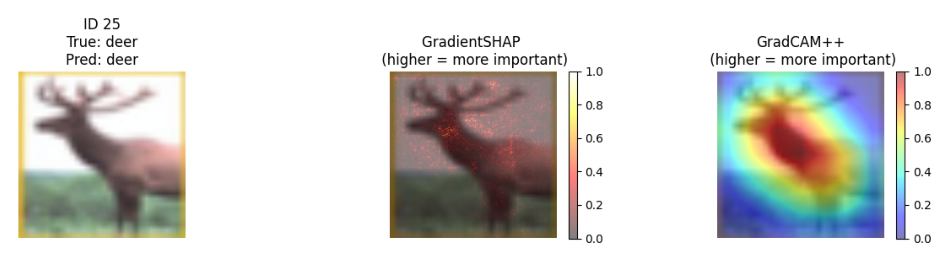

Cycle 9 images displayed.


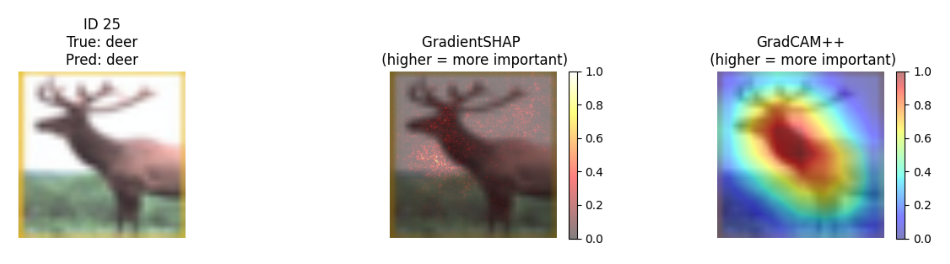

Cycle 10 images displayed.


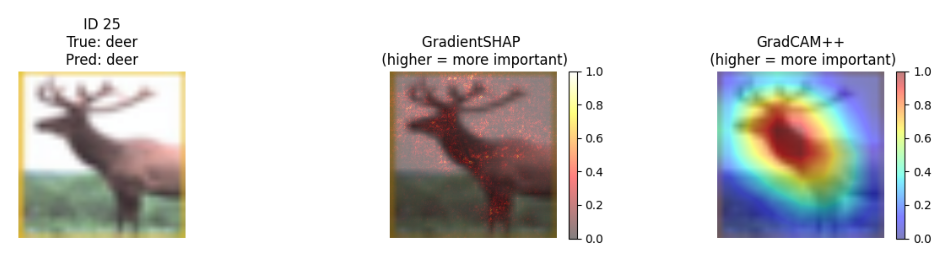

Cycle 11 images displayed.


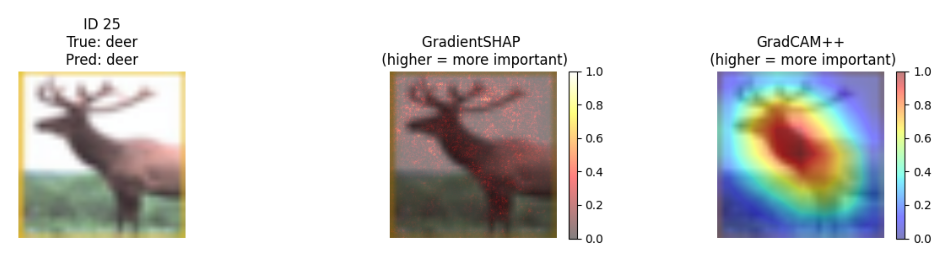

Cycle 12 images displayed.


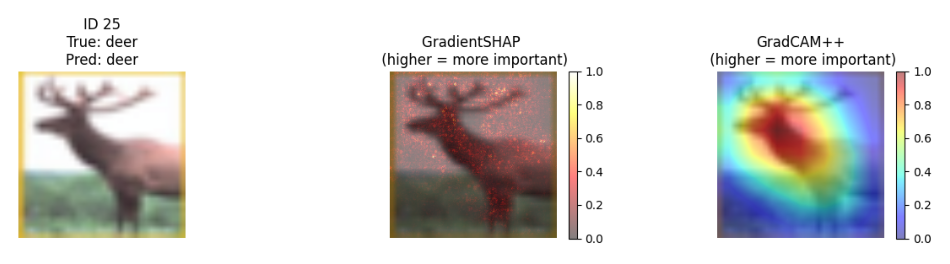

Cycle 13 images displayed.


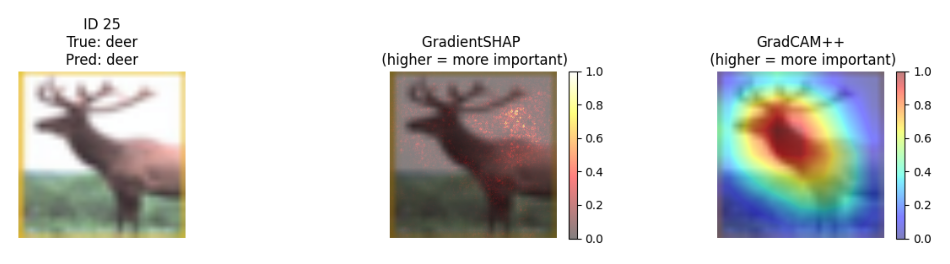

Cycle 14 images displayed.


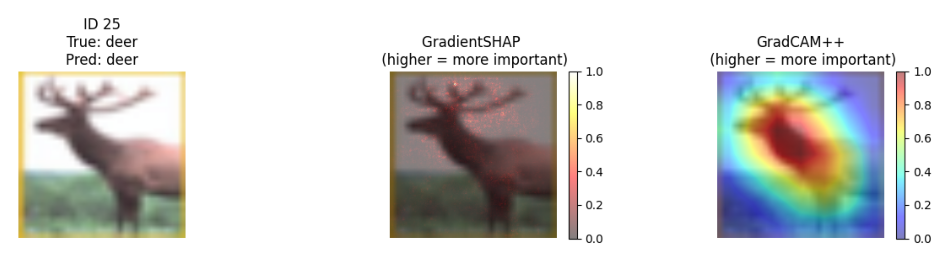

Cycle 15 images displayed.


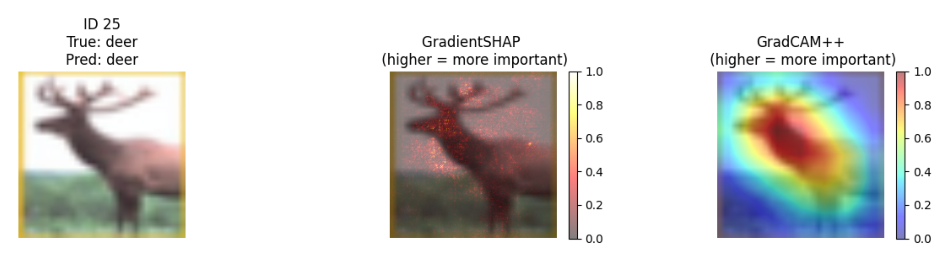

Cycle 16 images displayed.


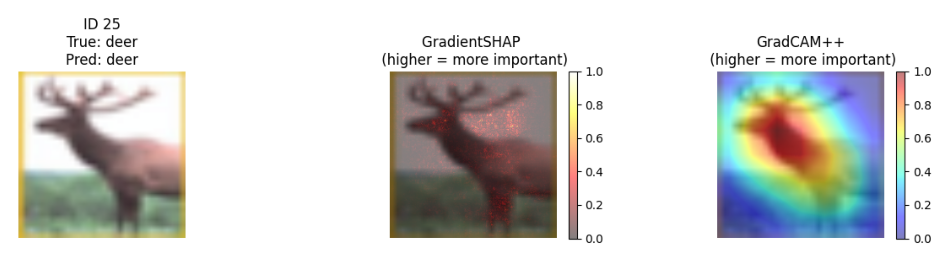

Cycle 17 images displayed.


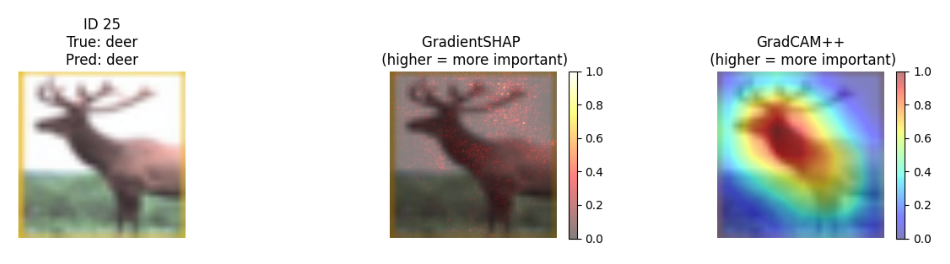

Cycle 18 images displayed.


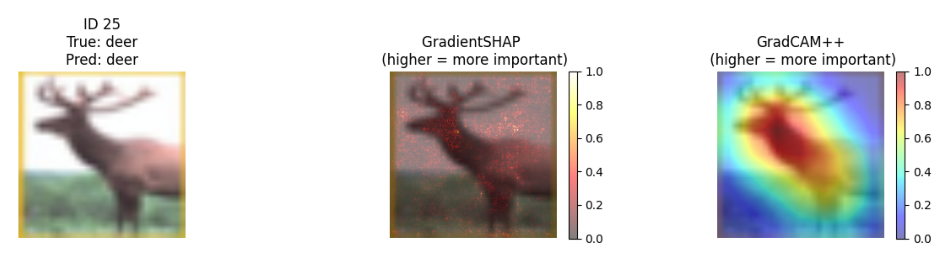

Cycle 19 images displayed.


In [ ]:
for i in range(20):
    # Replace with your actual image path
    # img_path = f'data/xai_images/cifar10/two/cycle_{i}/xai_0.png'
    img_path = None  # Set to None if you don't have an image
    img_path_1 = f'data/xai_images/cifar10/two/cycle_{i}/xai_25.png'
    # img_path_1 = None  # Set to None if you don't have a second image

    # Load and display the image
    if img_path is not None:
        img = mpimg.imread(img_path)
        plt.figure(figsize=(12, 12))
        plt.imshow(img)
        # plt.title(f"imaege: {img_path}")
        plt.axis('off')
        plt.show()
    if img_path_1 != None:
        img_1 = mpimg.imread(img_path_1)
        plt.figure(figsize=(12, 12))        
        plt.imshow(img_1)
        # plt.title(f"imaege: {img_path_1}")  
        plt.axis('off')
        plt.show()
    print(f"Cycle {i} images displayed.")

PCAM BASELINE TABLES

In [2]:
save_dir =Path( "./data/tables/pcam/one/baseline")
aggregate_gradcam_pcam = pd.read_csv(save_dir/'pcam_aggregate_table_gradcam.csv')
aggregate_shap_pcam = pd.read_csv(save_dir/'pcam_aggregate_table_shap.csv')
per_image_gradcam_pcam = pd.read_csv(save_dir/'pcam_per_image_table_gradcam.csv')
per_image_shap_pcam = pd.read_csv(save_dir/'pcam_per_image_table_shap.csv')

for df in [aggregate_gradcam_pcam, aggregate_shap_pcam]:
    for i in ["Consistency Mean", "Consistency Median"]:
        df.at[df.index[0], i] = np.nan

aggregate_gradcam_pcam.at[aggregate_gradcam_pcam.index[0], "XQS Mean"] = 0.581
aggregate_gradcam_pcam.at[aggregate_gradcam_pcam.index[0], "XQS Median"] = 0.583
aggregate_gradcam_pcam.at[aggregate_gradcam_pcam.index[0], "XQS Weighted Mean"] = np.nan
aggregate_gradcam_pcam.at[aggregate_gradcam_pcam.index[0], "XQS Weighted Median"] = np.nan

aggregate_shap_pcam.at[aggregate_shap_pcam.index[0], "XQS Mean"] = 0.449
aggregate_shap_pcam.at[aggregate_shap_pcam.index[0], "XQS Median"] = 0.450
aggregate_shap_pcam.at[aggregate_shap_pcam.index[0], "XQS Weighted Mean"] = np.nan
aggregate_shap_pcam.at[aggregate_shap_pcam.index[0], "XQS Weighted Medain"] = np.nan

### Per Image Outlier Analysis

In [54]:
for df in [per_image_gradcam_pcam, per_image_shap_pcam]:
    print(df["XAI Method"].iloc[0])
    for metric in ["XQS", "XQS Weighted","Continuity", "Compactness", "Correctness", "Consistency"]:
        method = df["XAI Method"].iloc[0]
        print(f"Using dataframe per image PCAM {method} for {metric}")
        all_dicts = {}
        result = {}
        for i in range(1,21):
            filtered = df[df['Cycle/PCAM'] == i]
            dict_list = [
                {"sample id": str(row["Sample ID"]), "XQS": str(row[metric])}
                for _, row in filtered.iterrows()
            ]
            all_dicts[f"dict_list{i}"] = dict_list

        for key, samples in all_dicts.items():
            # Convert XQS to float for sorting
            sorted_samples = sorted(samples, key=lambda x: float(x['XQS']))
            bottom_5 = sorted_samples[:5]
            top_5 = sorted_samples[-5:]
            # Store sample ids only
            result[key] = {
                'top_5': [s['sample id'] for s in reversed(top_5)],  # Highest XQS first
                'bottom_5': [s['sample id'] for s in bottom_5]       # Lowest XQS first
            }

        # print(result)

        top_ids = []
        bottom_ids = []

        for cycle_result in result.values():
            top_ids.extend(cycle_result['top_5'])
            bottom_ids.extend(cycle_result['bottom_5'])

        # Count occurrences
        top_counts = Counter(top_ids)
        bottom_counts = Counter(bottom_ids)

        # Get the most common sample ids
        most_common_top = top_counts.most_common(5)
        most_common_bottom = bottom_counts.most_common(5)

        print("Most frequent in top 5:", most_common_top)
        print("Most frequent in bottom 5:", most_common_bottom)
        print("----------------------------------------------------")
    print("*************************************************************")


GradCAM
Using dataframe per image PCAM GradCAM for XQS
Most frequent in top 5: [('64', 20), ('37', 19), ('52', 19), ('8', 11), ('12', 9)]
Most frequent in bottom 5: [('95', 16), ('16', 13), ('74', 12), ('79', 12), ('43', 9)]
----------------------------------------------------
Using dataframe per image PCAM GradCAM for XQS Weighted
Most frequent in top 5: [('64', 20), ('52', 18), ('37', 17), ('12', 12), ('50', 11)]
Most frequent in bottom 5: [('95', 16), ('74', 13), ('16', 13), ('79', 11), ('43', 9)]
----------------------------------------------------
Using dataframe per image PCAM GradCAM for Continuity
Most frequent in top 5: [('2', 20), ('96', 12), ('38', 11), ('47', 9), ('32', 7)]
Most frequent in bottom 5: [('95', 13), ('4', 10), ('99', 8), ('16', 8), ('58', 7)]
----------------------------------------------------
Using dataframe per image PCAM GradCAM for Compactness
Most frequent in top 5: [('64', 20), ('37', 20), ('52', 18), ('11', 12), ('8', 7)]
Most frequent in bottom 5: [('

GradCAM


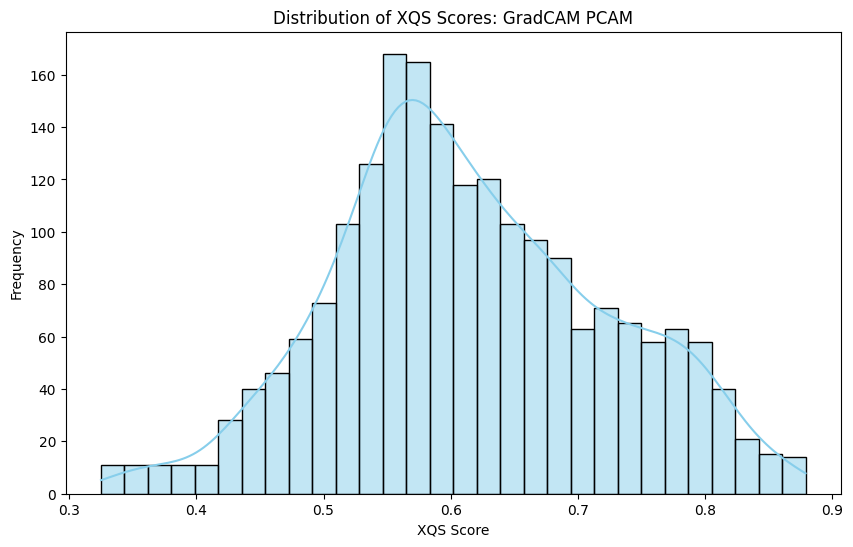

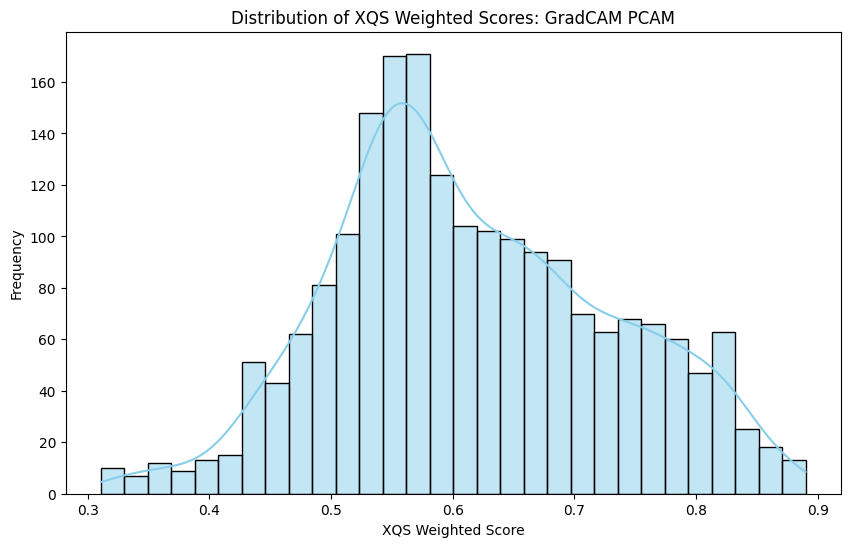

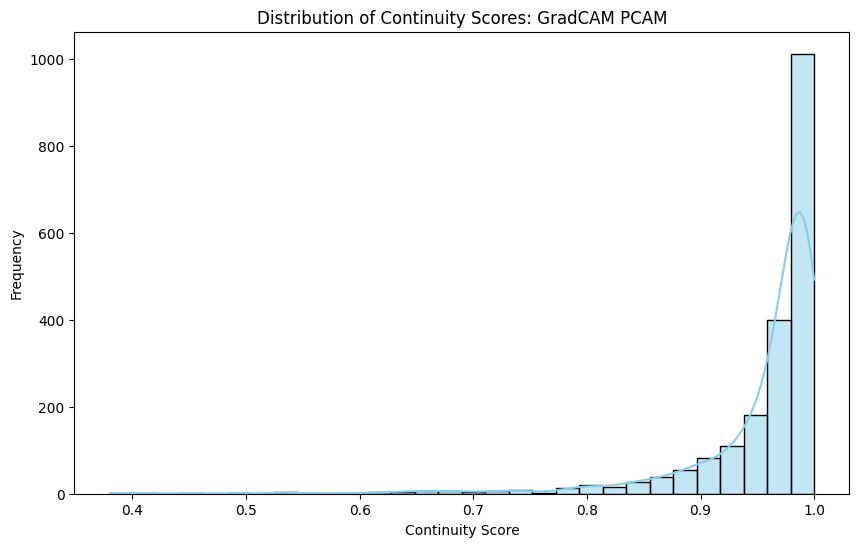

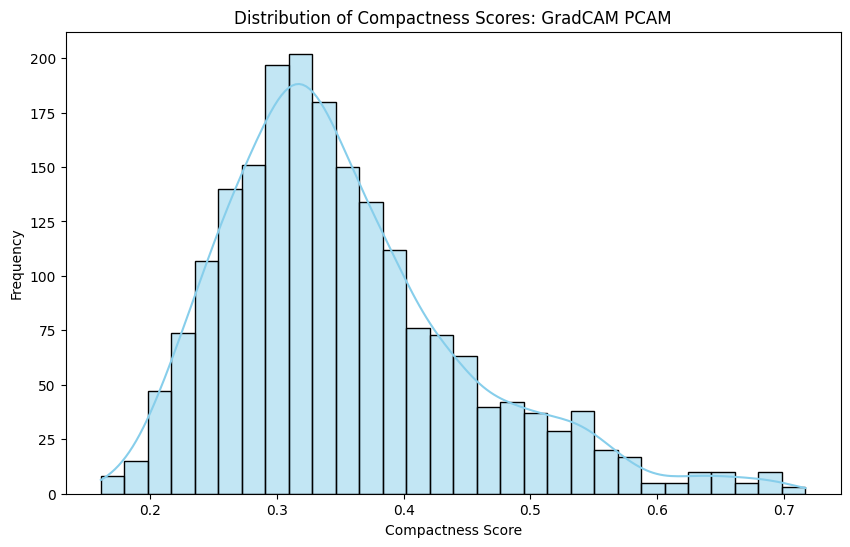

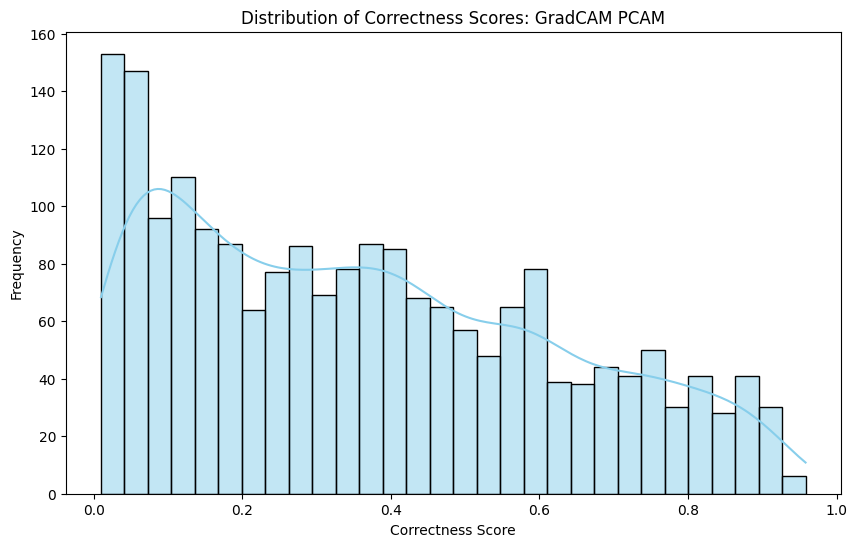

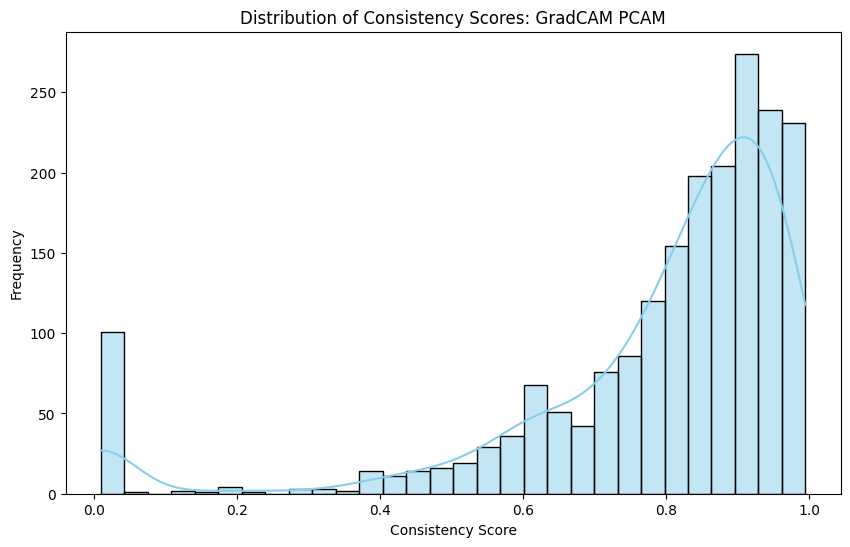

SHAP


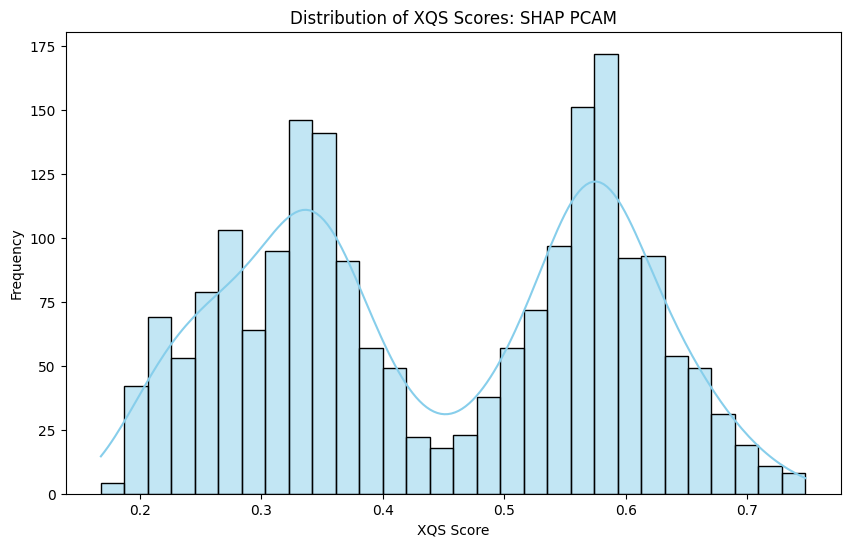

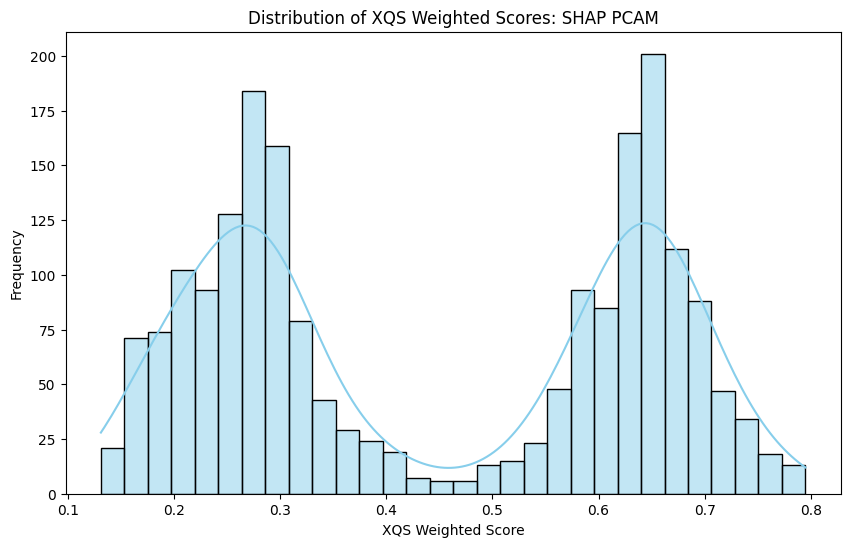

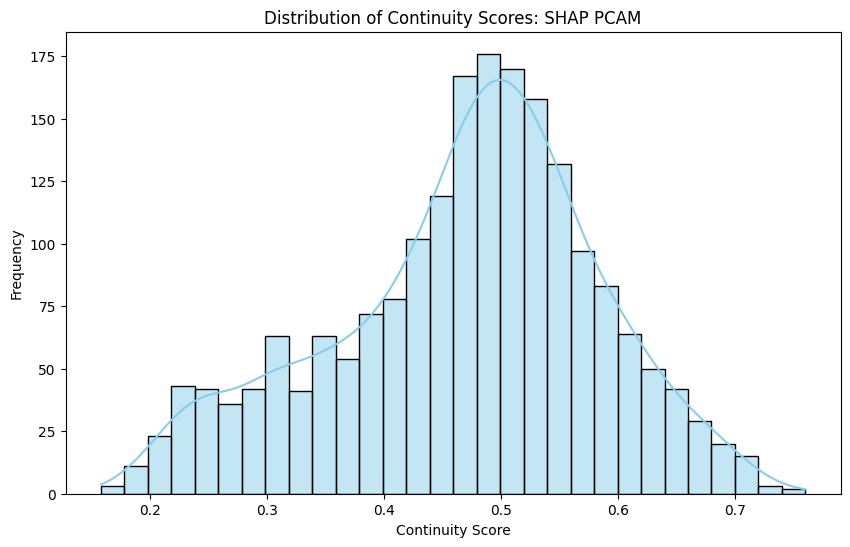

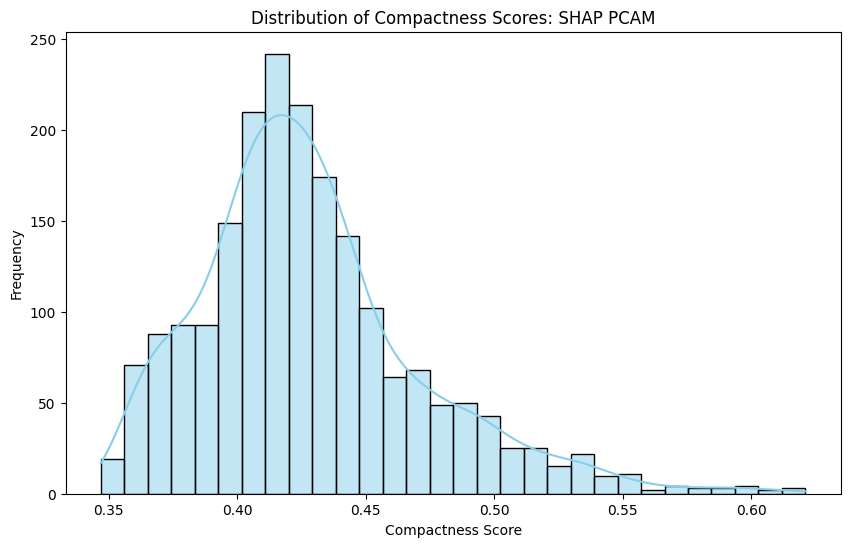

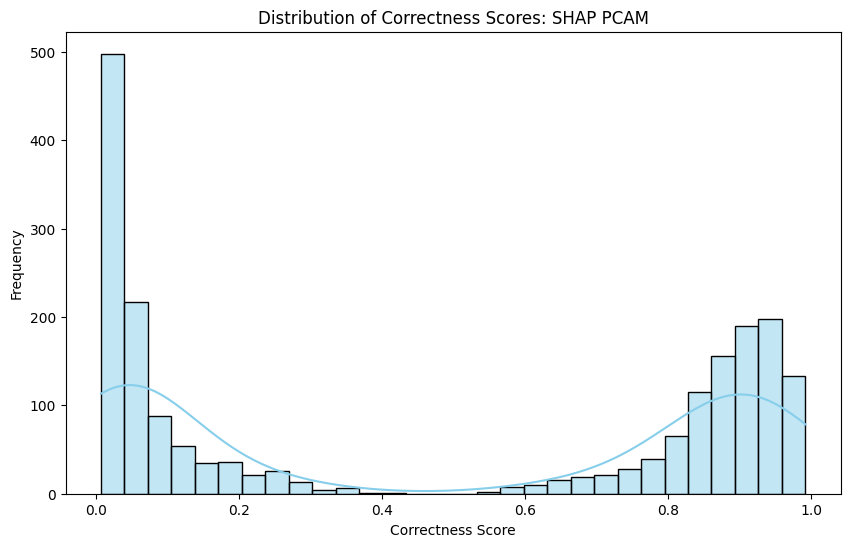

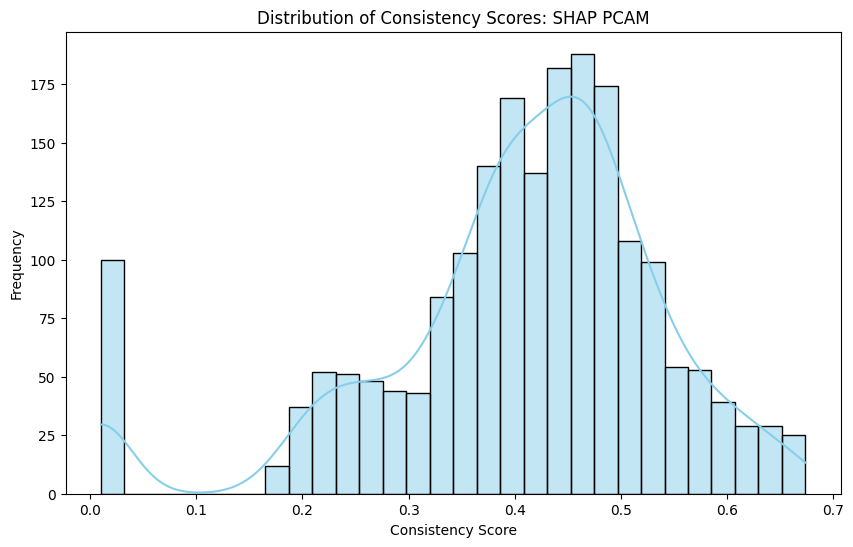

In [68]:
for df in [per_image_gradcam_pcam, per_image_shap_pcam]:
    print(df["XAI Method"].iloc[0])
    for metric in ["XQS", "XQS Weighted","Continuity", "Compactness", "Correctness", "Consistency"]:
        method = df["XAI Method"].iloc[0]
        plt.figure(figsize=(10, 6))
        sns.histplot(df[metric].to_numpy(), kde=True, bins=30, color='skyblue')
        plt.title(f'Distribution of {metric} Scores: {method} PCAM')
        plt.xlabel(f'{metric} Score')
        plt.ylabel('Frequency')
        plt.show()

In [66]:
for df in [per_image_gradcam_pcam, per_image_shap_pcam]:
    print(df["XAI Method"].iloc[0])
    metrics=["XQS", "XQS Weighted","Continuity", "Compactness", "Correctness", "Consistency"]
    print(df[metrics].describe().T)
    print("----------------------------------------------------")

GradCAM
               count      mean       std    min    25%    50%    75%    max
XQS           2000.0  0.614234  0.108080  0.325  0.543  0.601  0.688  0.879
XQS Weighted  2000.0  0.614882  0.114783  0.311  0.536  0.597  0.695  0.890
Continuity    2000.0  0.955958  0.066548  0.380  0.950  0.980  0.992  1.000
Compactness   2000.0  0.352189  0.096585  0.161  0.285  0.334  0.399  0.717
Correctness   2000.0  0.365097  0.256041  0.010  0.135  0.333  0.563  0.958
Consistency   2000.0  0.783722  0.226246  0.010  0.736  0.857  0.926  0.995
----------------------------------------------------
SHAP
               count      mean       std    min      25%     50%    75%    max
XQS           2000.0  0.443790  0.146095  0.168  0.32100  0.4245  0.576  0.748
XQS Weighted  2000.0  0.445252  0.197910  0.131  0.26500  0.3870  0.642  0.795
Continuity    2000.0  0.469041  0.114078  0.158  0.40100  0.4850  0.546  0.760
Compactness   2000.0  0.428204  0.043448  0.347  0.40100  0.4220  0.448  0.621
Correct

PLOT PCAM MODEL METRICS

In [5]:

pcam_metrics = aggregate_gradcam_pcam[["Cycle/PCAM", "Accuracy", "Precision", "Recall", "F1", "AUC"]].copy()

pcam_metrics["Accuracy"] = (100 * pcam_metrics["Accuracy"]).round(1)
pcam_metrics["Precision"] = (100 * pcam_metrics["Precision"]).round(1)
pcam_metrics["Recall"] = (100 * pcam_metrics["Recall"]).round(1)
pcam_metrics["F1"] = (100 * pcam_metrics["F1"]).round(1)
pcam_metrics["AUC"] = (100 * pcam_metrics["AUC"]).round(1)
# pcam_metrics["AUC"] = (100 * pcam_metrics["AUC"]).round(0).astype(int)

pcam_metrics.head()

,Cycle/PCAM,Accuracy,Precision,Recall,F1,AUC
0,1,81.1,78.1,86.2,82.0,90.3
1,2,81.8,81.1,82.7,81.9,90.3
2,3,81.8,79.4,85.8,82.5,91.1
3,4,83.2,83.4,83.0,83.2,91.5
4,5,84.2,83.6,85.1,84.3,92.6


In [ ]:
one = pd.DataFrame()
df = aggregate_gradcam_pcam.copy()
one["XQS deifference"] = df["XQS Mean"]-df["XQS Median"]
one["XQS Weighted deifference"] = df["XQS Weighted Mean"]-df["XQS Weighted Median"]

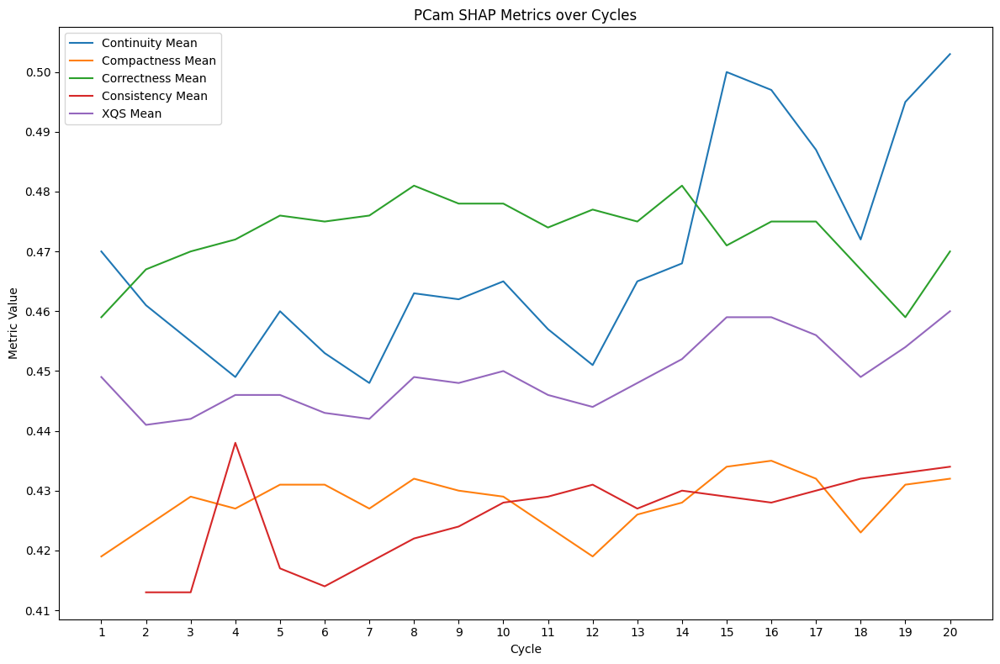

In [6]:
plt.figure(figsize=(12, 8))
metrics = ["Continuity Mean", "Compactness Mean", "Correctness Mean", "Consistency Mean", "XQS Mean"]

for metric in metrics:
    plt.plot(aggregate_shap_pcam["Cycle/PCAM"], aggregate_shap_pcam[metric], label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("PCam SHAP Metrics over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()

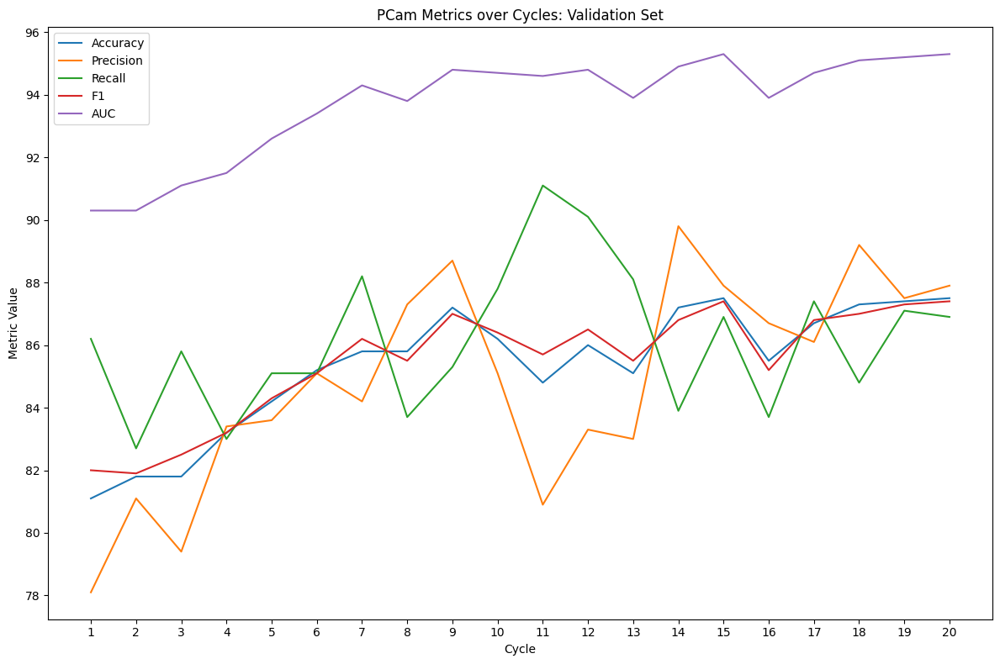

In [6]:
plt.figure(figsize=(12, 8))
metrics = ["Accuracy", "Precision", "Recall", "F1", "AUC"]

for metric in metrics:
    plt.plot(pcam_metrics["Cycle/PCAM"], pcam_metrics[metric], label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("PCam Metrics over Cycles: Validation Set")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()

## Random Sampling

In [ ]:
save_dir =Path( "./data/models/pcam/random_sampling")
random_sampling = pd.read_csv(save_dir/'eval_metrics.csv').round(4)
random_sampling["Accuracy"] = (100 * random_sampling["Accuracy"]).round(2)
random_sampling["Precision"] = (100 * random_sampling["Precision"]).round(2)
random_sampling["Recall"] = (100 * random_sampling["Recall"]).round(2)  
random_sampling["F1"] = (100 * random_sampling["F1"]).round(2)
random_sampling["AUC"] = (100 * random_sampling["AUC"]).round(2)

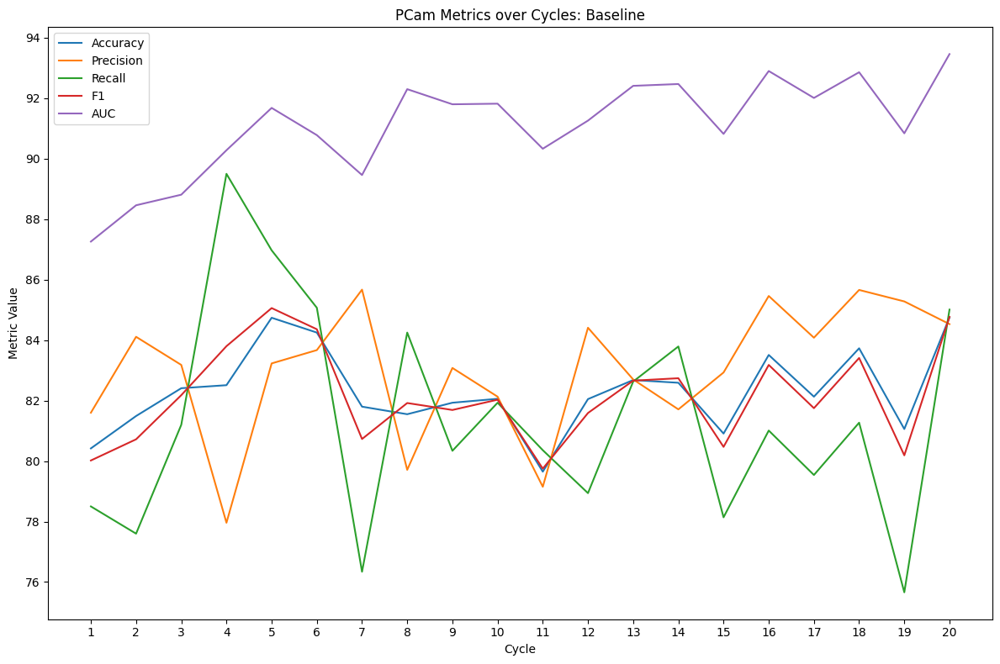

In [95]:
plt.figure(figsize=(12, 8))
metrics = ["Accuracy", "Precision", "Recall", "F1", "AUC"]

for metric in metrics:
    plt.plot(random_sampling["Cycle"], random_sampling[metric], label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("PCam Metrics over Cycles: Baseline")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()

In [31]:
df = aggregate_gradcam_pcam
aggregate_gradcam_pcam = aggregate_gradcam_pcam.drop(index=aggregate_gradcam_pcam.index[0])
aggregate_shap_pcam = aggregate_shap_pcam.drop(index=aggregate_shap_pcam.index[0])


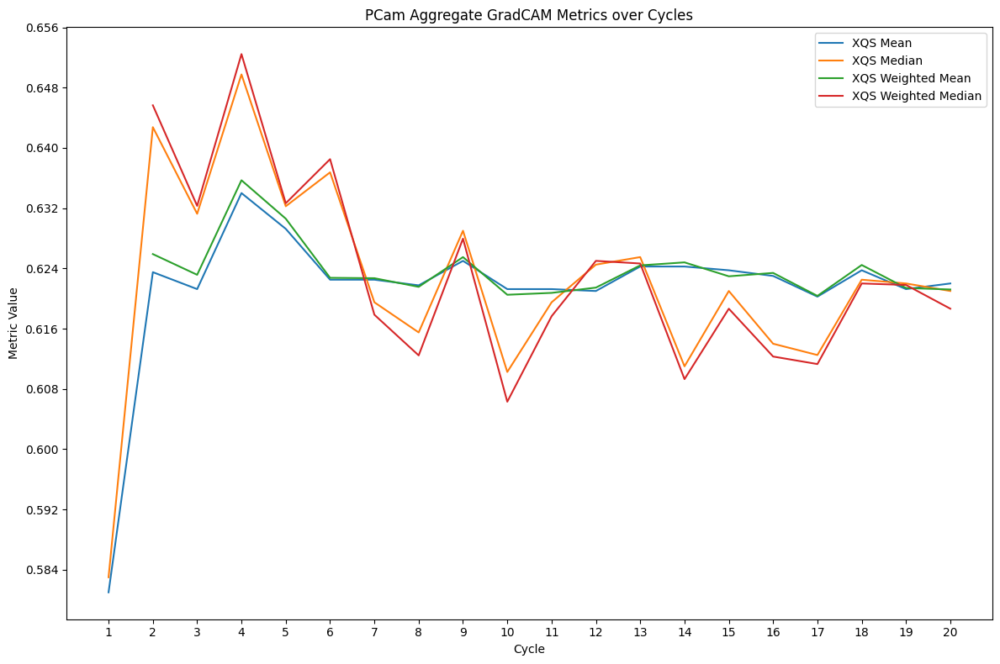

In [115]:
plt.figure(figsize=(12, 8))
metrics = ["XQS Mean", "XQS Median", "XQS Weighted Mean", "XQS Weighted Median"]

for metric in metrics:
    plt.plot(aggregate_gradcam_pcam["Cycle/PCAM"], (aggregate_gradcam_pcam[metric]), label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("PCam Aggregate GradCAM Metrics over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()

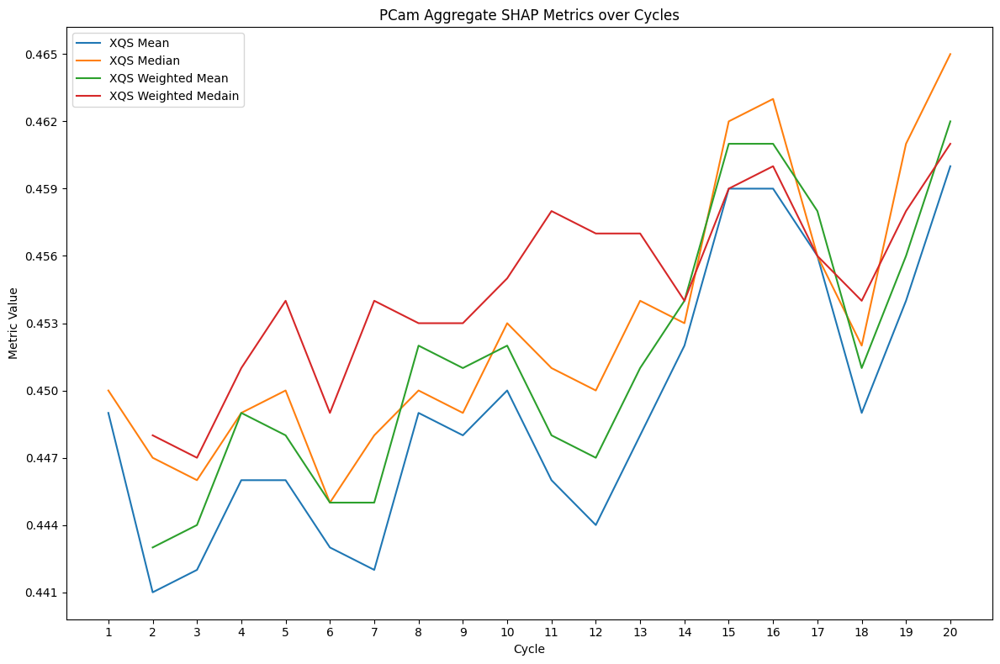

In [116]:
plt.figure(figsize=(12, 8))
metrics = ["XQS Mean", "XQS Median", "XQS Weighted Mean", "XQS Weighted Medain"]

for metric in metrics:
    plt.plot(aggregate_shap_pcam["Cycle/PCAM"], (aggregate_shap_pcam[metric]), label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("PCam Aggregate SHAP Metrics over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()

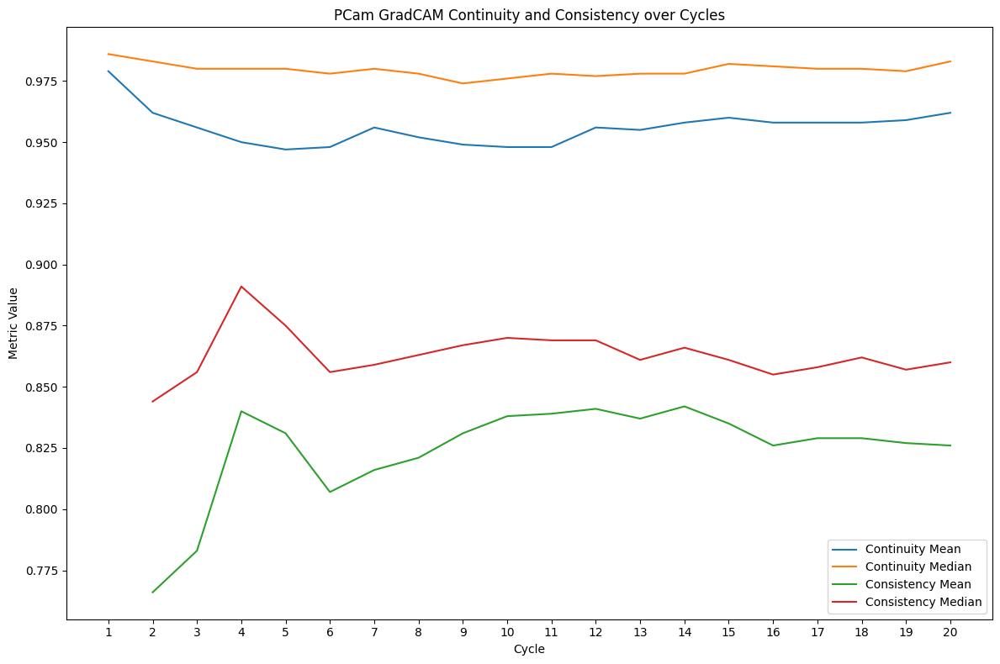

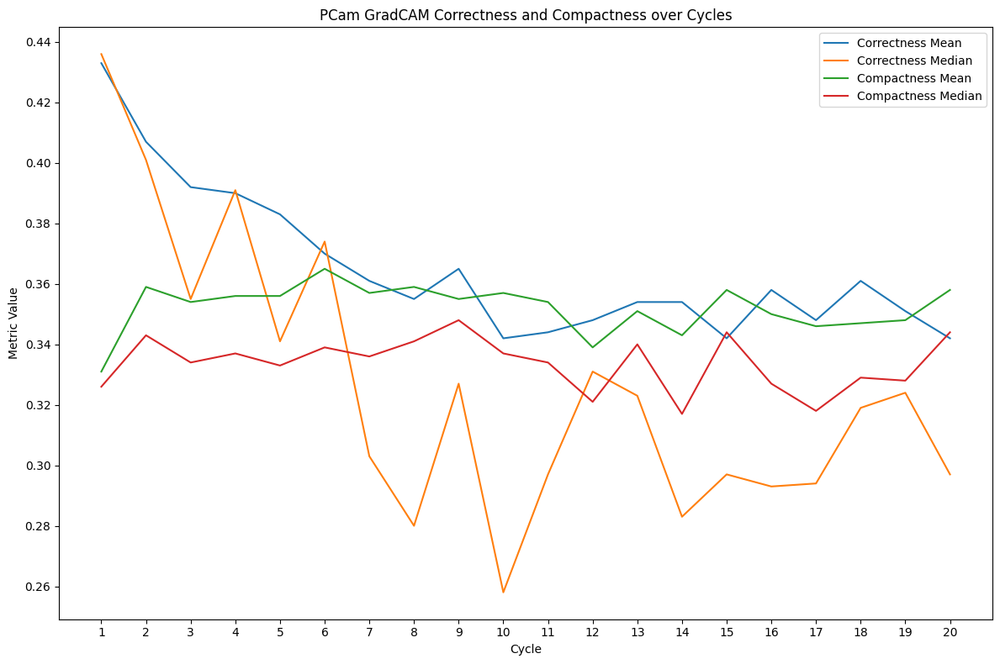

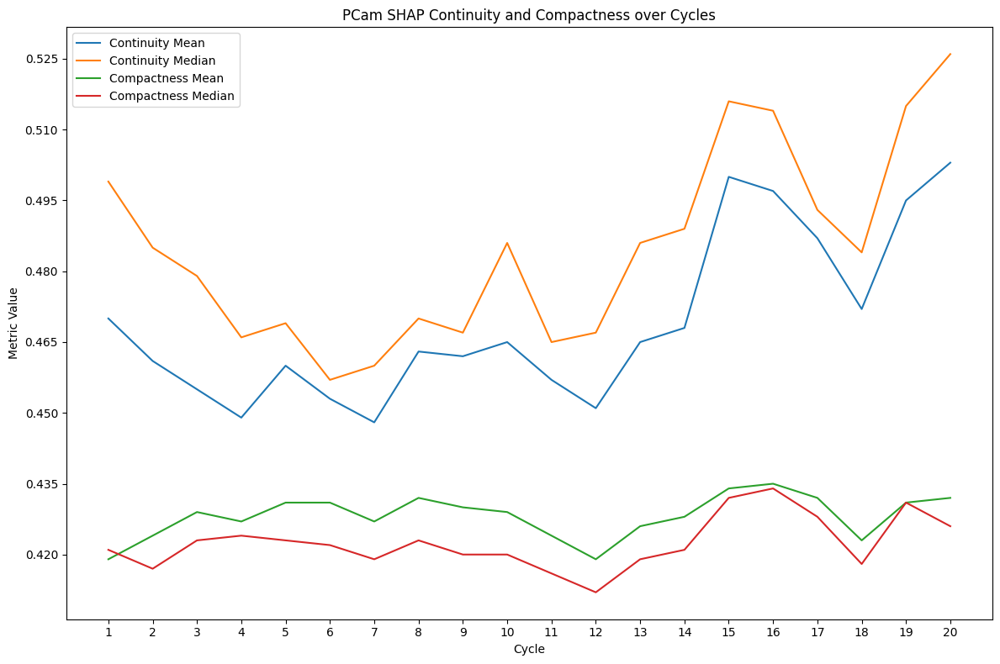

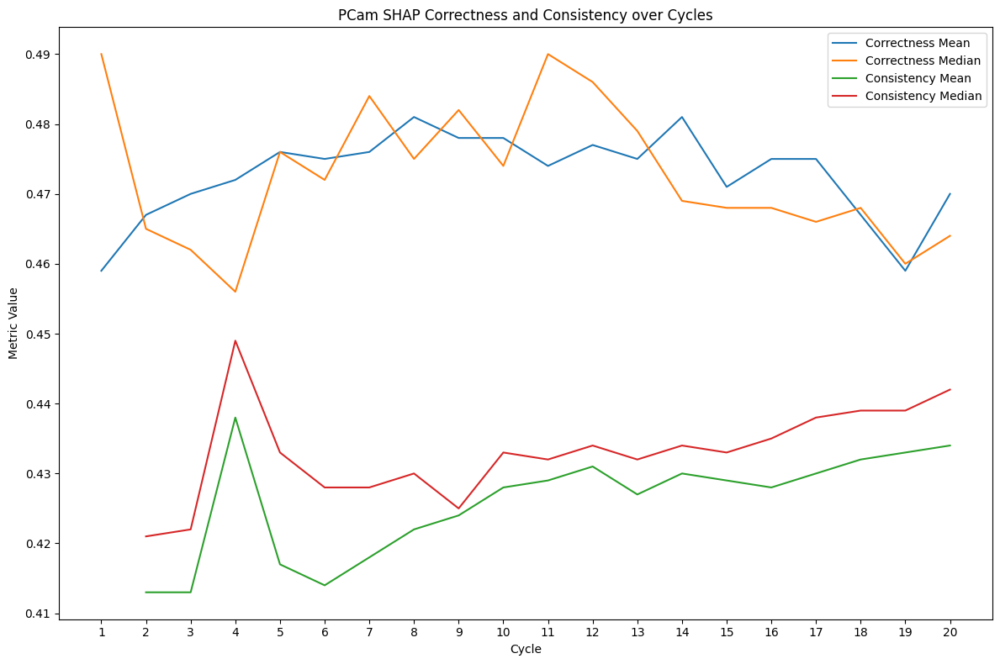

In [109]:
plt.figure(figsize=(12, 8))
metrics = ["Continuity Mean","Continuity Median","Consistency Mean",  "Consistency Median" ]

for metric in metrics:
    plt.plot(aggregate_gradcam_pcam["Cycle/PCAM"], (aggregate_gradcam_pcam[metric]), label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("PCam GradCAM Continuity and Consistency over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
metrics = [ "Correctness Mean","Correctness Median", "Compactness Mean","Compactness Median"]

for metric in metrics:
    plt.plot(aggregate_gradcam_pcam["Cycle/PCAM"], (aggregate_gradcam_pcam[metric]), label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("PCam GradCAM Correctness and Compactness over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
metrics = ["Continuity Mean","Continuity Median", "Compactness Mean","Compactness Median" ]

for metric in metrics:
    plt.plot(aggregate_shap_pcam["Cycle/PCAM"], (aggregate_shap_pcam[metric]), label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("PCam SHAP Continuity and Compactness over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
metrics = [ "Correctness Mean","Correctness Median","Consistency Mean",  "Consistency Median"]

for metric in metrics:
    plt.plot(aggregate_shap_pcam["Cycle/PCAM"], (aggregate_shap_pcam[metric]), label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("PCam SHAP Correctness and Consistency over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()



## Correlation Analysis

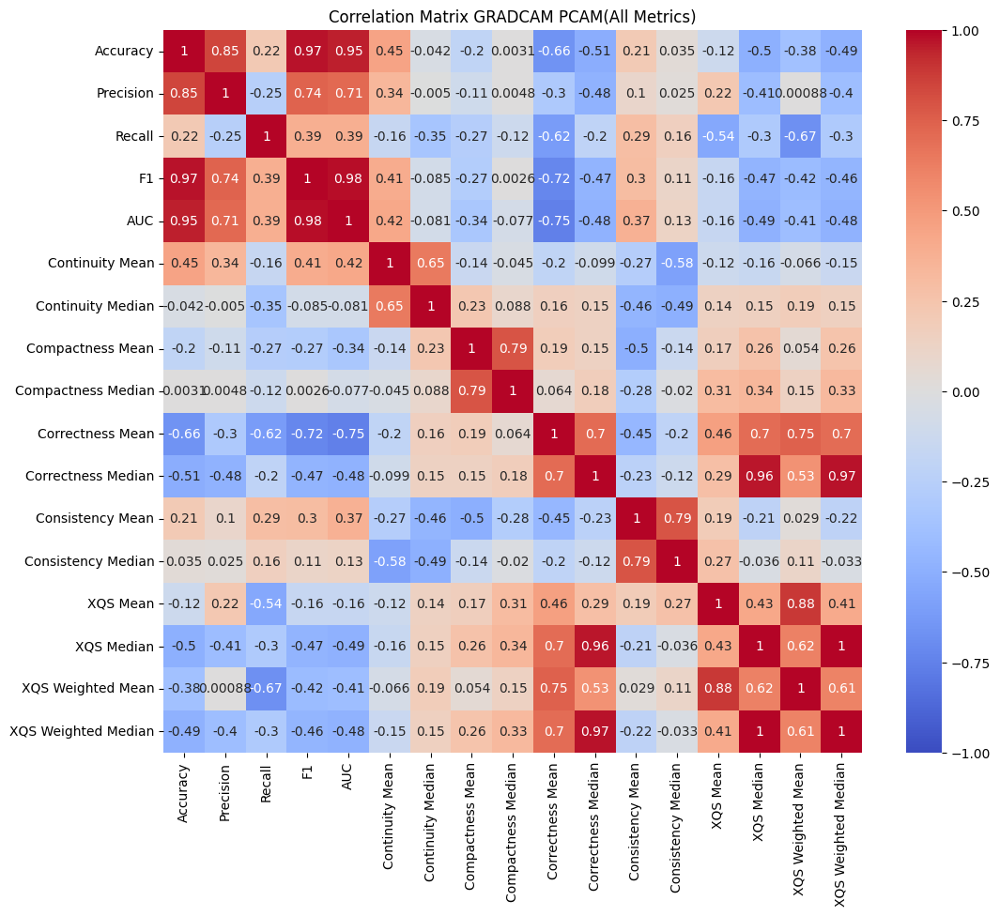

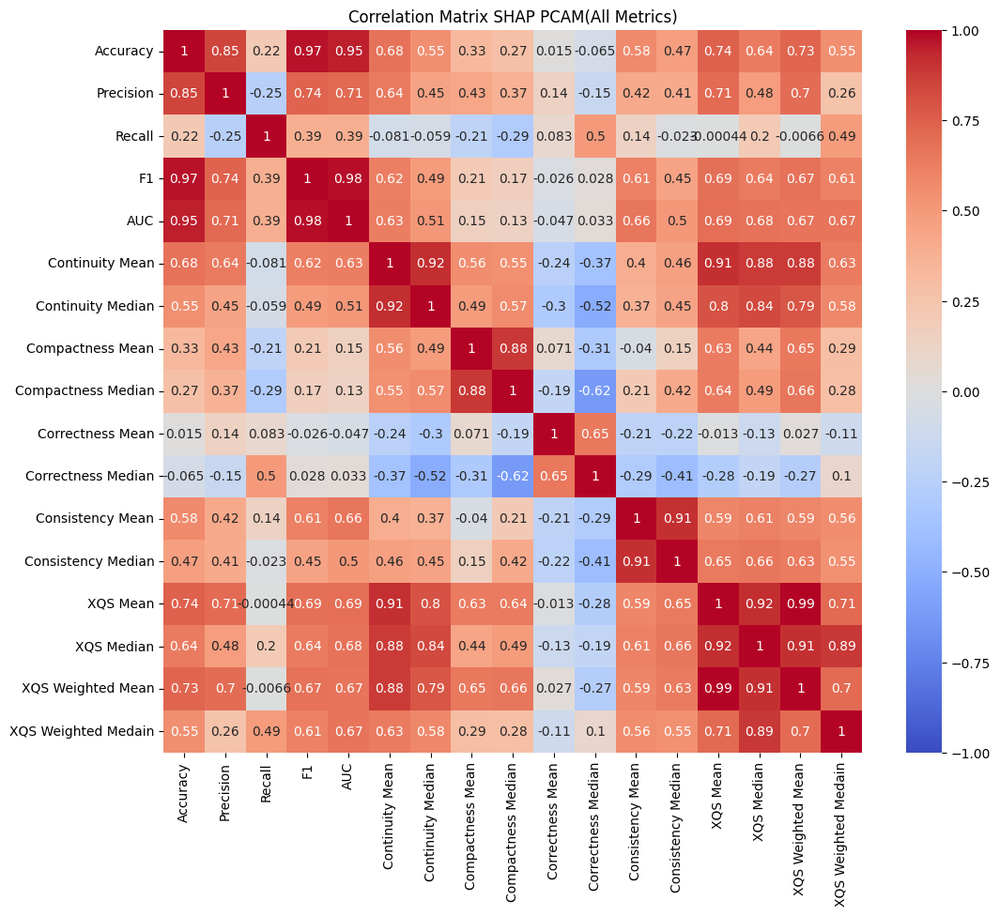

In [21]:
# Compute pairwise correlations
# aggregate_gradcam_pcam_corr = aggregate_gradcam_pcam.drop(columns=["XAI Method", "Cycle/PCAM"]).corr(method='pearson').copy()  # or 'spearman'

# # Visualize as heatmap
# plt.figure(figsize=(12, 10))
# sns.heatmap(aggregate_gradcam_pcam_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
# plt.title("Correlation Matrix  Pearson GRADCAM PCAM(All Metrics)")
# plt.show()

plt.figure(figsize=(12, 10))
sns.heatmap(aggregate_gradcam_pcam.drop(columns=["XAI Method", "Cycle/PCAM"]).corr(method='spearman'), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix GRADCAM PCAM(All Metrics)")
plt.show()


plt.figure(figsize=(12, 10))
sns.heatmap(aggregate_shap_pcam.drop(columns=["XAI Method", "Cycle/PCAM"]).corr(method='spearman'), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix SHAP PCAM(All Metrics)")
plt.show()


# plt.figure(figsize=(12, 10))
# sns.heatmap(per_image_gradcam_pcam.drop(columns=["XAI Method", "Cycle/PCAM"]).corr(method='spearman'), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
# plt.title("Correlation Matrix Spearman (All Metrics)")
# plt.show()


In [53]:
one = list(aggregate_gradcam_pcam.columns .drop(["XAI Method", "Cycle/PCAM"]))
two = list(aggregate_shap_pcam.columns .drop(["XAI Method", "Cycle/PCAM"]))
for i in one:
    for j in one:
        corr, p_value = spearmanr(aggregate_gradcam_pcam[i], aggregate_gradcam_pcam[j])
        if corr < 0 and p_value < 0.1:
            print(f"{i} vs. {j}: r={corr:.3f}, p={p_value:.4f}")

# for i in two:
#     for j in two:
#         corr, p_value = spearmanr(aggregate_shap_pcam[i], aggregate_shap_pcam[j])
#         if corr > 0.5 and p_value < 0.001:
#             print(f"{i} vs. {j}: r={corr:.3f}, p={p_value:.4f}")


Accuracy vs. Correctness Mean: r=-0.712, p=0.0004
Accuracy vs. Correctness Median: r=-0.582, p=0.0071
Precision vs. Correctness Mean: r=-0.404, p=0.0770
Precision vs. Correctness Median: r=-0.552, p=0.0117
Recall vs. Correctness Mean: r=-0.583, p=0.0070
Recall vs. XQS Mean: r=-0.561, p=0.0100
Recall vs. XQS Weighted Mean: r=-0.596, p=0.0056
F1 vs. Correctness Mean: r=-0.759, p=0.0001
F1 vs. Correctness Median: r=-0.548, p=0.0125
AUC vs. Correctness Mean: r=-0.787, p=0.0000
AUC vs. Correctness Median: r=-0.555, p=0.0112
Continuity Mean vs. Consistency Median: r=-0.644, p=0.0022
Continuity Median vs. Consistency Mean: r=-0.543, p=0.0134
Continuity Median vs. Consistency Median: r=-0.566, p=0.0092
Correctness Mean vs. Accuracy: r=-0.712, p=0.0004
Correctness Mean vs. Precision: r=-0.404, p=0.0770
Correctness Mean vs. Recall: r=-0.583, p=0.0070
Correctness Mean vs. F1: r=-0.759, p=0.0001
Correctness Mean vs. AUC: r=-0.787, p=0.0000
Correctness Mean vs. Consistency Mean: r=-0.528, p=0.0166


### Experiments

In [32]:
save_dir =Path( "./data/tables/pcam/one/experiments")
continuity_exp_1 = pd.read_csv(save_dir/'continuity_exp_1.csv')
continuity_exp_2 = pd.read_csv(save_dir/'continuity_exp_2.csv')
continuity_exp_3 = pd.read_csv(save_dir/'continuity_exp_3.csv')
continuity_exp_4 = pd.read_csv(save_dir/'continuity_exp_4.csv')
correctness_exp_1 = pd.read_csv(save_dir/'correctness_exp_1.csv')
correctness_exp_2 = pd.read_csv(save_dir/'correctness_exp_2.csv')
correctness_exp_3 = pd.read_csv(save_dir/'correctness_exp_3.csv')
correctness_exp_4 = pd.read_csv(save_dir/'correctness_exp_4.csv')
consistency_exp_1 = pd.read_csv(save_dir/'consistency_exp_1.csv')
consistency_exp_2 = pd.read_csv(save_dir/'consistency_exp_2.csv')

In [33]:
lis = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]

for i in [continuity_exp_1, continuity_exp_2, continuity_exp_3, continuity_exp_4]:
    df = i
    df["Baseline Mean Gradcam"] = aggregate_gradcam_pcam["Continuity Mean"]
    df["Baseline Median Gradcam"] = aggregate_gradcam_pcam["Continuity Median"]
    df["Baseline Mean SHAP"] = aggregate_shap_pcam["Continuity Mean"]
    df["Baseline Median SHAP"] = aggregate_shap_pcam["Continuity Median"]
    df["cycle"] = lis

for i in [correctness_exp_1, correctness_exp_2, correctness_exp_3, correctness_exp_4]:
    df = i
    df["Baseline Mean Gradcam"] = aggregate_gradcam_pcam["Correctness Mean"]
    df["Baseline Median Gradcam"] = aggregate_gradcam_pcam["Correctness Median"]
    df["Baseline Mean SHAP"] = aggregate_shap_pcam["Correctness Mean"]
    df["Baseline Median SHAP"] = aggregate_shap_pcam["Correctness Median"]
    df["cycle"] = lis

for i in [consistency_exp_1, consistency_exp_2]:
    df = i
    df["Baseline Mean Gradcam"] = aggregate_gradcam_pcam["Consistency Mean"]
    df["Baseline Median Gradcam"] = aggregate_gradcam_pcam["Consistency Median"]
    df["Baseline Mean SHAP"] = aggregate_shap_pcam["Consistency Mean"]
    df["Baseline Median SHAP"] = aggregate_shap_pcam["Consistency Median"]
    df["cycle"] = lis
    

In [27]:
consistency_exp_1 = consistency_exp_1.drop(index=consistency_exp_1.index[0])

In [ ]:
for df in [continuity_exp_1, continuity_exp_2, continuity_exp_3, continuity_exp_4]:
    print(f"Petrubution: {df.iloc[0][0]}")
    print("MEAN VALUES")
    mad = np.mean(np.abs(df["Baseline Mean SHAP"] - df["Continuity Mean Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean SHAP"] - df["Continuity Mean Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Mean Gradcam"] - df["Continuity Mean Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean Gradcam"] - df["Continuity Mean Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")

    print("MEDIAN VALUES")
    mad = np.mean(np.abs(df["Baseline Median SHAP"] - df["Continuity Median Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Median SHAP"] - df["Continuity Median Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")  
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Median Gradcam"] - df["Continuity Median Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Median Gradcam"] - df["Continuity Median Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")
    print("----------------------------------------------------")

for df in [correctness_exp_1, correctness_exp_2, correctness_exp_3, correctness_exp_4]:
    print(f"Petrubution: {df.iloc[0][0]}")
    print("MEAN VALUES")
    mad = np.mean(np.abs(df["Baseline Mean SHAP"] - df["Correctness Mean Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean SHAP"] - df["Correctness Mean Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Mean Gradcam"] - df["Correctness Mean Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean Gradcam"] - df["Correctness Mean Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")

    print("MEDIAN VALUES")
    mad = np.mean(np.abs(df["Baseline Median SHAP"] - df["Correctness Median Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Median SHAP"] - df["Correctness Median Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")  
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Median Gradcam"] - df["Correctness Median Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Median Gradcam"] - df["Correctness Median Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")
    print("----------------------------------------------------")

for df in [consistency_exp_1, consistency_exp_2]:
    print(f"Petrubution: {df.iloc[0][0]}")
    print("MEAN VALUES")
    mad = np.mean(np.abs(df["Baseline Mean SHAP"] - df["Consistency Mean Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean SHAP"] - df["Consistency Mean Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Mean Gradcam"] - df["Consistency Mean Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean Gradcam"] - df["Consistency Mean Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")

    print("MEDIAN VALUES")
    mad = np.mean(np.abs(df["Baseline Median SHAP"] - df["Consistency Median Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Median SHAP"] - df["Consistency Median Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")  
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Median Gradcam"] - df["Consistency Median Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Median Gradcam"] - df["Consistency Median Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")
    print("----------------------------------------------------")

Petrubution: pearson
MEAN VALUES
Mean Absolute Difference SHAP: 0.0833
Root Mean Square Error SHAP: 0.0857
Mean Absolute Difference GradCAM: 0.0227
Root Mean Square Error GradCAM: 0.0234
MEDIAN VALUES
Mean Absolute Difference SHAP: 0.0847
Root Mean Square Error SHAP: 0.0871
Mean Absolute Difference GradCAM: 0.0278
Root Mean Square Error GradCAM: 0.0303
----------------------------------------------------
Petrubution: kendall
MEAN VALUES
Mean Absolute Difference SHAP: 0.1236
Root Mean Square Error SHAP: 0.1268
Mean Absolute Difference GradCAM: 0.1491
Root Mean Square Error GradCAM: 0.1531
MEDIAN VALUES
Mean Absolute Difference SHAP: 0.1242
Root Mean Square Error SHAP: 0.1275
Mean Absolute Difference GradCAM: 0.1649
Root Mean Square Error GradCAM: 0.1693
----------------------------------------------------


/tmp/ipykernel_2199/670915310.py:52: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Petrubution: {df.iloc[0][0]}")


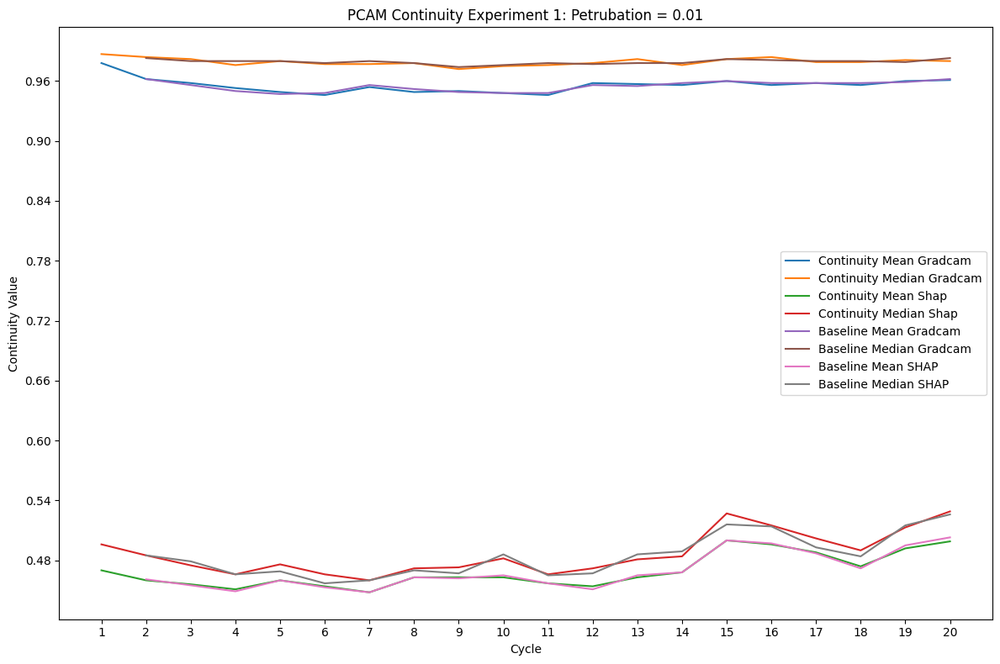

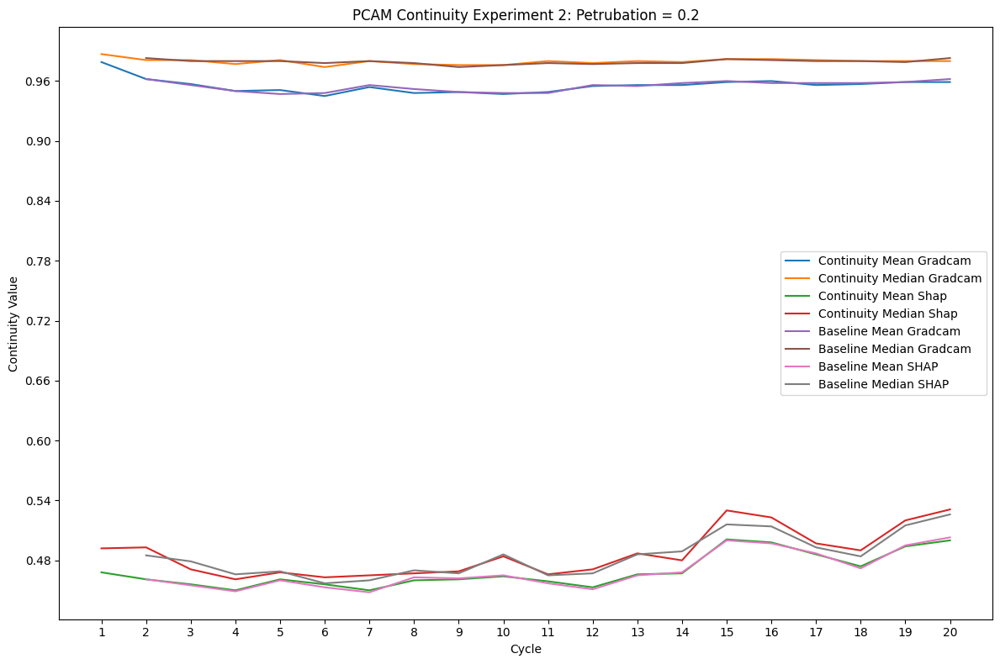

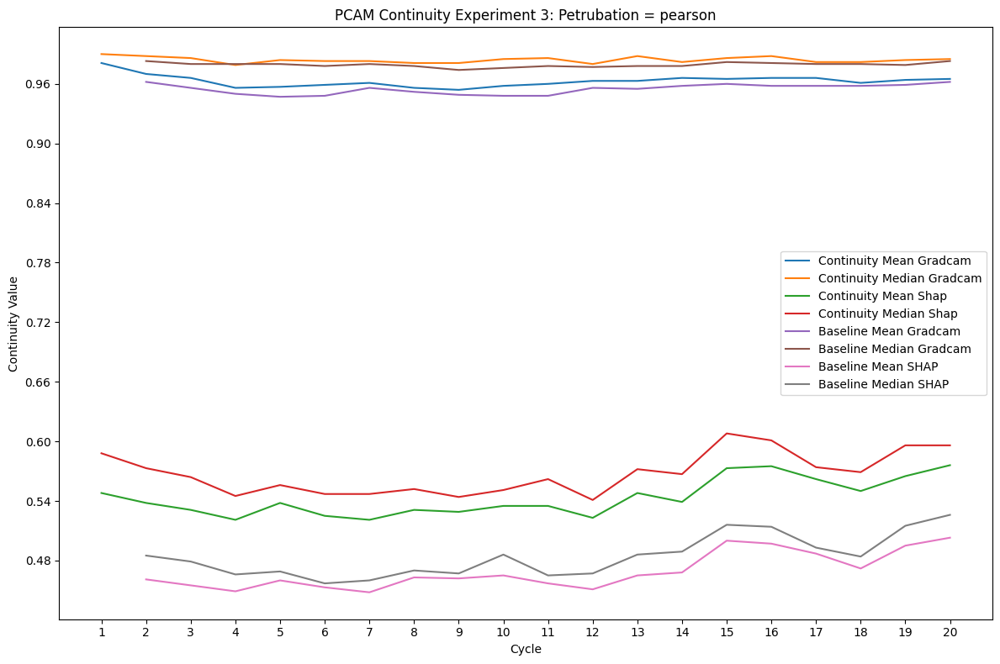

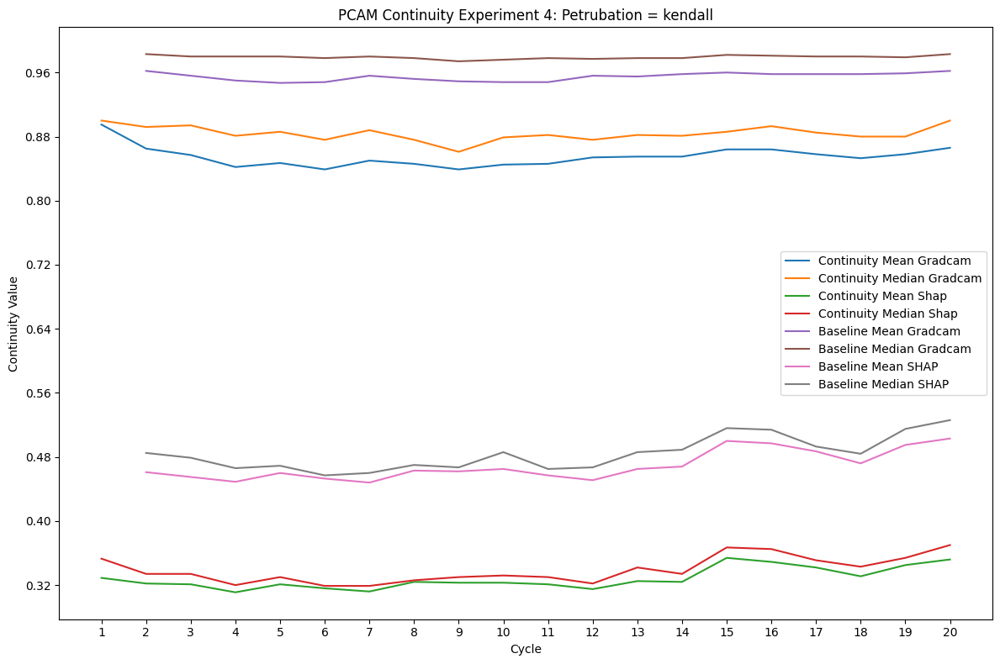

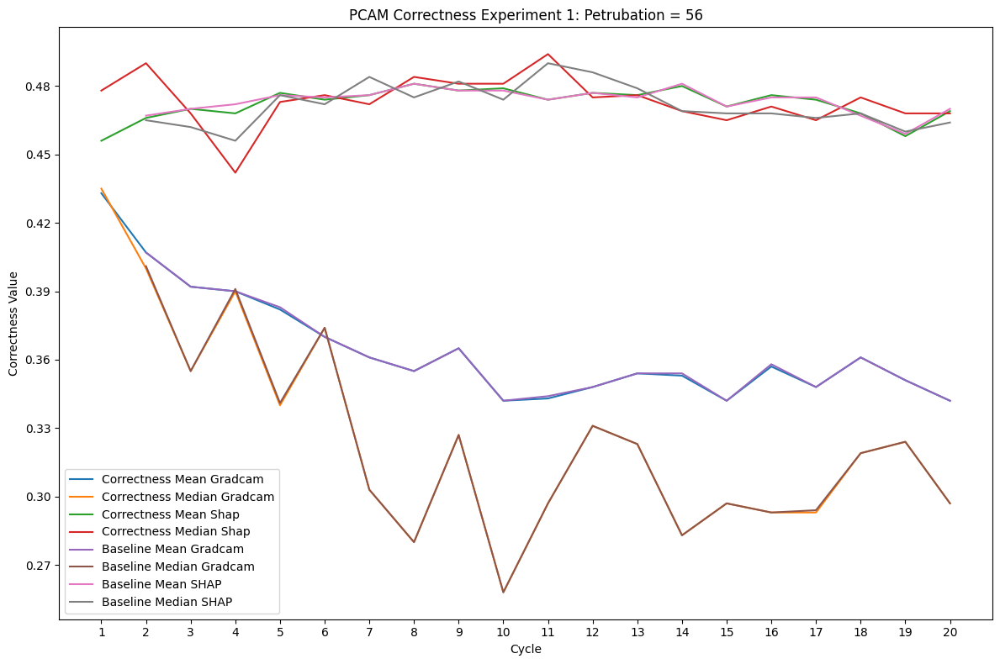

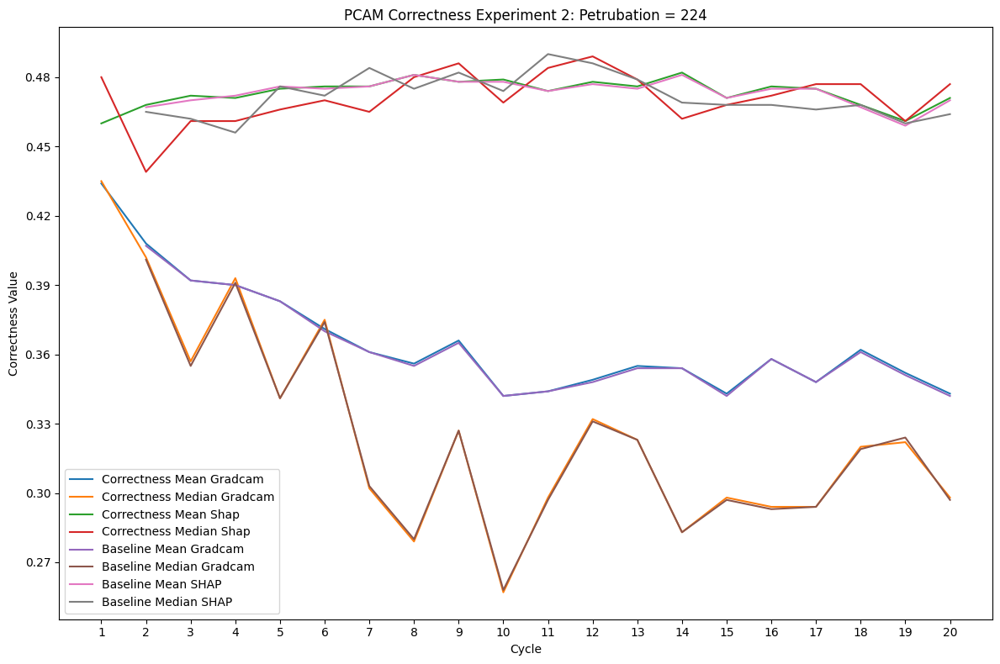

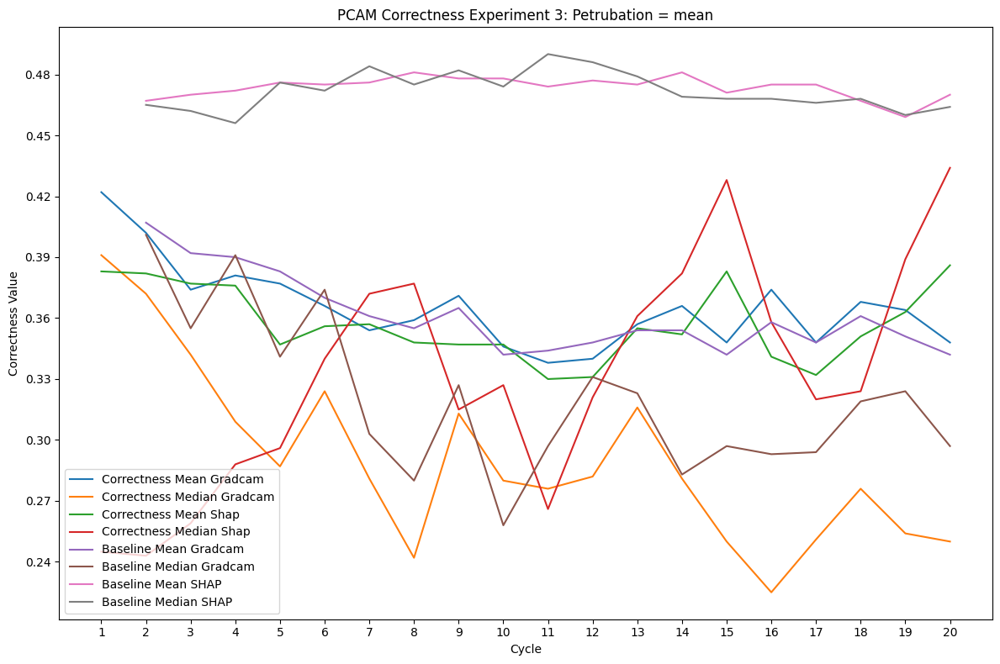

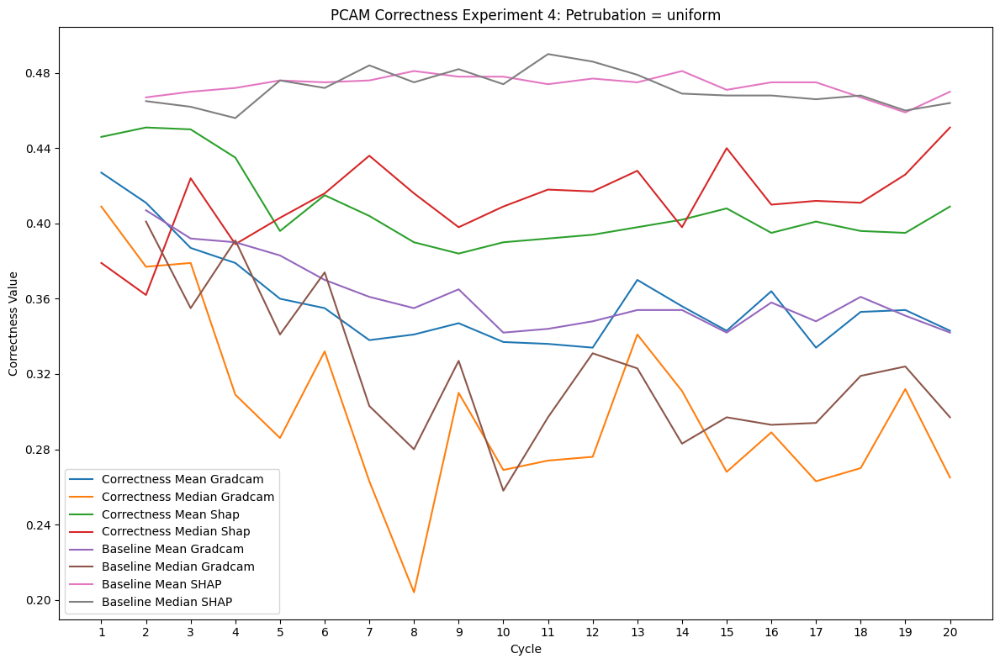

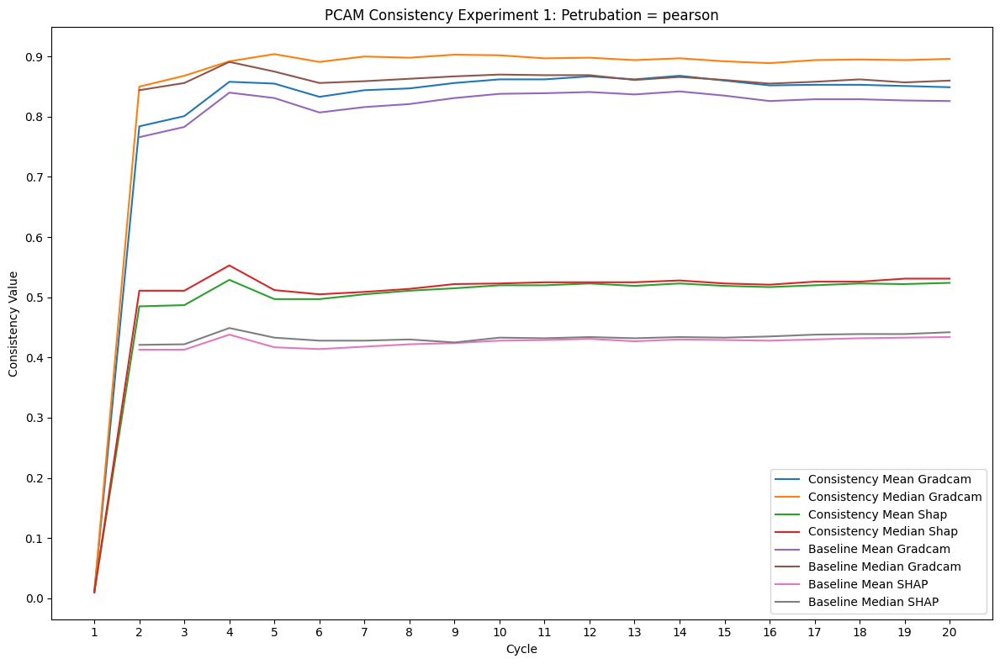

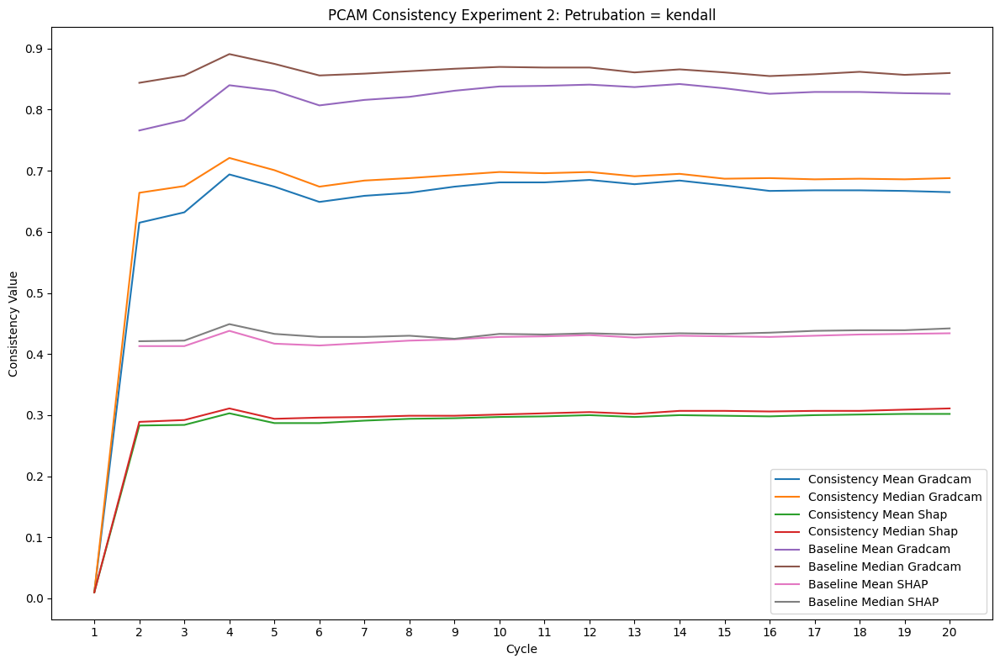

In [35]:
i=1
for df in [continuity_exp_1, continuity_exp_2, continuity_exp_3, continuity_exp_4]:
    plt.figure(figsize=(12, 8))
    column_names = list(df.columns)
    one = column_names[0]
    column_names.pop(0)  # Remove the first element (index 0)
    column_names.pop(-1)  # Remove the last element
    for metric in column_names:
        plt.plot(df["cycle"], df[metric], label=metric)
    plt.xlabel("Cycle")
    plt.ylabel("Continuity Value")
    plt.title(f"PCAM Continuity Experiment {i}: Petrubation = {df[one].iloc[0]}")
    plt.legend()
    plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    plt.xticks(range(1, 21))
    plt.tight_layout()
    plt.show()
    i = i+1

i = 1
for df in [correctness_exp_1, correctness_exp_2, correctness_exp_3, correctness_exp_4]:
    plt.figure(figsize=(12, 8))
    column_names = list(df.columns)
    one = column_names[0]
    column_names.pop(0)  # Remove the first element (index 0)
    column_names.pop(-1)  # Remove the last element
    for metric in column_names:
        plt.plot(df["cycle"], df[metric], label=metric)
    plt.xlabel("Cycle")
    plt.ylabel("Correctness Value")
    plt.title(f"PCAM Correctness Experiment {i}: Petrubation = {df[one].iloc[0]}")
    plt.legend()
    plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    plt.xticks(range(1, 21))
    plt.tight_layout()
    plt.show()
    i= i+1

i = 1
for df in [consistency_exp_1, consistency_exp_2]:
    plt.figure(figsize=(12, 8))
    column_names = list(df.columns)
    one = column_names[0]
    column_names.pop(0)  # Remove the first element (index 0)
    column_names.pop(-1)  # Remove the last element
    for metric in column_names:
        plt.plot(df["cycle"], df[metric], label=metric)
    plt.xlabel("Cycle")
    plt.ylabel("Consistency Value")
    plt.title(f"PCAM Consistency Experiment {i}: Petrubation = {df[one].iloc[0]}")
    plt.legend()
    plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    plt.xticks(range(1, 21))
    plt.tight_layout()
    plt.show()
    i= i+1


# CIFAR

CIFAR BASELINE TABLES

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg
from pathlib import Path
import matplotlib.ticker as ticker
from scipy.stats import pearsonr, spearmanr
from collections import Counter
import numpy as np

In [ ]:
save_dir =Path( "./data/tables/cifar/two/baseline/changed")
aggregate_gradcam_cifar = pd.read_csv(save_dir/'cifar_aggregate_table_gradcam.csv')
aggregate_shap_cifar = pd.read_csv(save_dir/'cifar_aggregate_table_shap.csv')
per_image_gradcam_cifar = pd.read_csv(save_dir/'cifar_per_image_table_gradcam.csv')
per_image_shap_cifar = pd.read_csv(save_dir/'cifar_per_image_table_shap.csv')


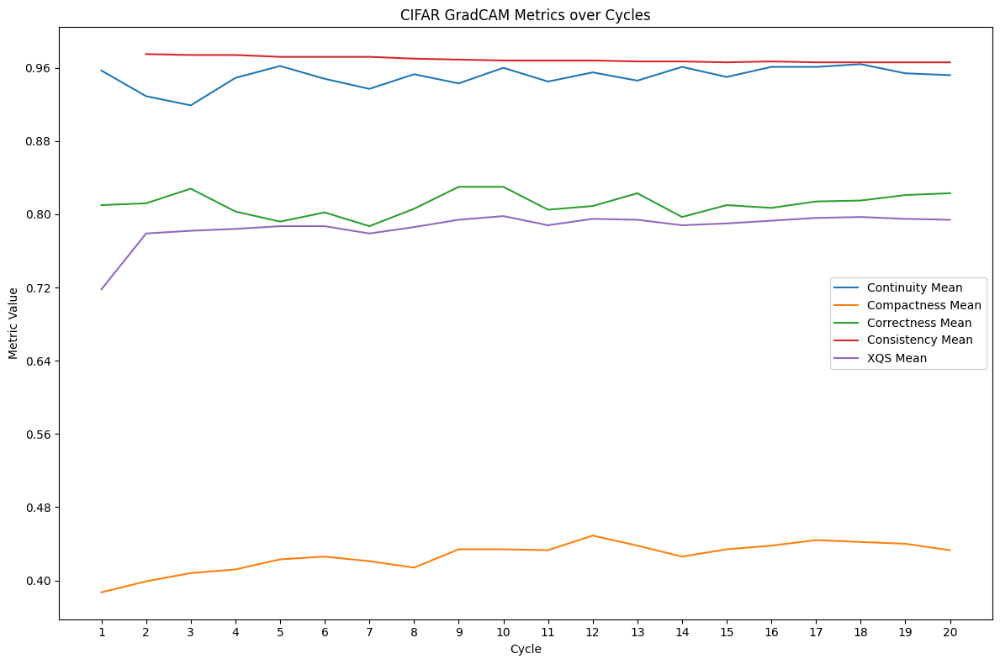

In [14]:
plt.figure(figsize=(12, 8))
metrics = ["Continuity Mean", "Compactness Mean", "Correctness Mean", "Consistency Mean", "XQS Mean"]

for metric in metrics:
    plt.plot(aggregate_gradcam_cifar["Cycle/CIFAR"], aggregate_gradcam_cifar[metric], label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("CIFAR GradCAM Metrics over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()

### Per Image Outlier Analysis

In [59]:
for df in [per_image_gradcam_cifar, per_image_shap_cifar]:
    print(df["XAI Method"].iloc[0])
    for metric in ["XQS", "XQS Weighted","Continuity", "Compactness", "Correctness", "Consistency"]:
        
        method = df["XAI Method"].iloc[0]
        print(f"Using dataframe per image CIFAR {method} for {metric}")
        all_dicts = {}
        result = {}
        for i in range(1,21):
            filtered = df[df['Cycle/CIFAR'] == i]
            dict_list = [
                {"sample id": str(row["Sample ID"]), "XQS": str(row[metric])}
                for _, row in filtered.iterrows()
            ]
            all_dicts[f"dict_list{i}"] = dict_list

        for key, samples in all_dicts.items():
            # Convert XQS to float for sorting
            sorted_samples = sorted(samples, key=lambda x: float(x['XQS']))
            bottom_5 = sorted_samples[:5]
            top_5 = sorted_samples[-5:]
            # Store sample ids only
            result[key] = {
                'top_5': [s['sample id'] for s in reversed(top_5)],  # Highest XQS first
                'bottom_5': [s['sample id'] for s in bottom_5]       # Lowest XQS first
            }

        # print(result)

        top_ids = []
        bottom_ids = []

        for cycle_result in result.values():
            top_ids.extend(cycle_result['top_5'])
            bottom_ids.extend(cycle_result['bottom_5'])

        # Count occurrences
        top_counts = Counter(top_ids)
        bottom_counts = Counter(bottom_ids)

        # Get the most common sample ids
        most_common_top = top_counts.most_common(5)
        most_common_bottom = bottom_counts.most_common(5)

        print("Most frequent in top 5:", most_common_top)
        print("Most frequent in bottom 5:", most_common_bottom)
        print("----------------------------------------------------")
    print("*************************************************************")


GradCAM
Using dataframe per image CIFAR GradCAM for XQS
Most frequent in top 5: [('58', 19), ('70', 18), ('73', 18), ('64', 13), ('69', 6)]
Most frequent in bottom 5: [('40', 14), ('16', 14), ('33', 12), ('84', 11), ('8', 8)]
----------------------------------------------------
Using dataframe per image CIFAR GradCAM for XQS Weighted
Most frequent in top 5: [('58', 20), ('70', 18), ('73', 16), ('64', 12), ('69', 5)]
Most frequent in bottom 5: [('16', 15), ('33', 13), ('40', 11), ('84', 10), ('8', 8)]
----------------------------------------------------
Using dataframe per image CIFAR GradCAM for Continuity
Most frequent in top 5: [('70', 12), ('58', 9), ('57', 8), ('47', 8), ('69', 7)]
Most frequent in bottom 5: [('61', 18), ('36', 14), ('43', 11), ('8', 10), ('40', 8)]
----------------------------------------------------
Using dataframe per image CIFAR GradCAM for Compactness
Most frequent in top 5: [('73', 20), ('70', 18), ('12', 14), ('58', 13), ('6', 11)]
Most frequent in bottom 5:

GradCAM


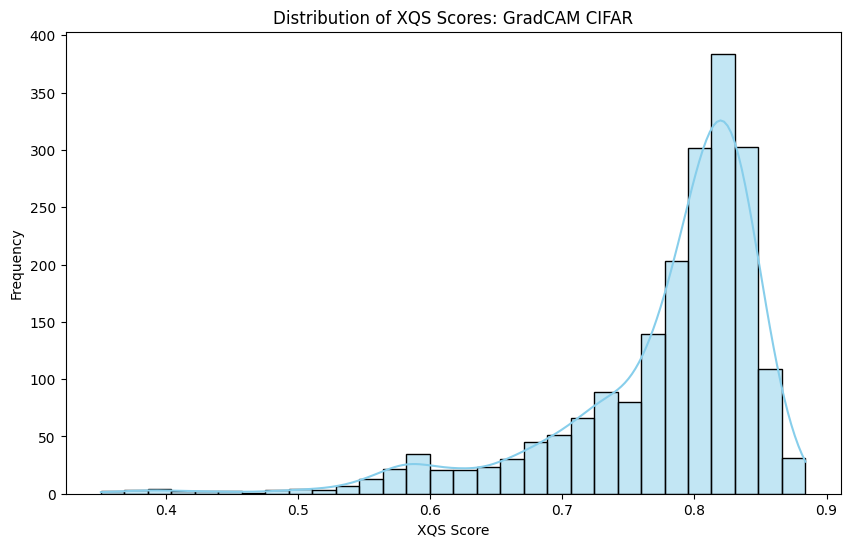

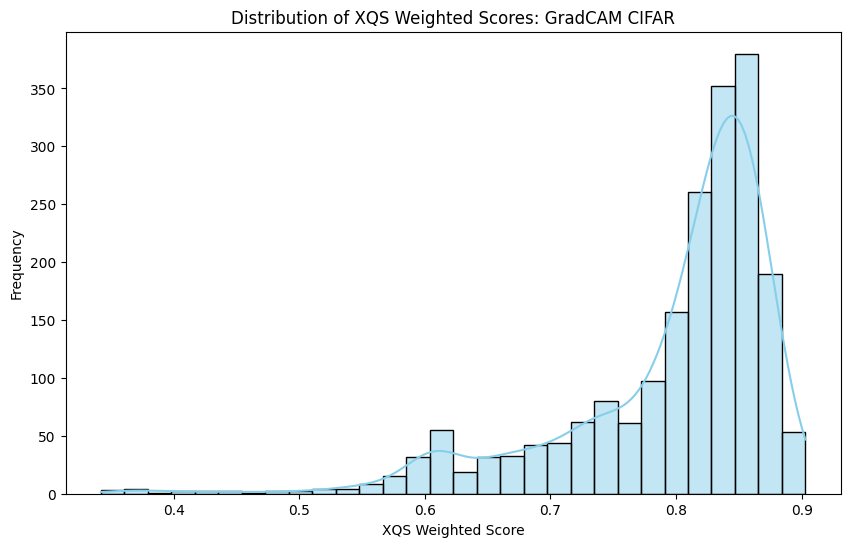

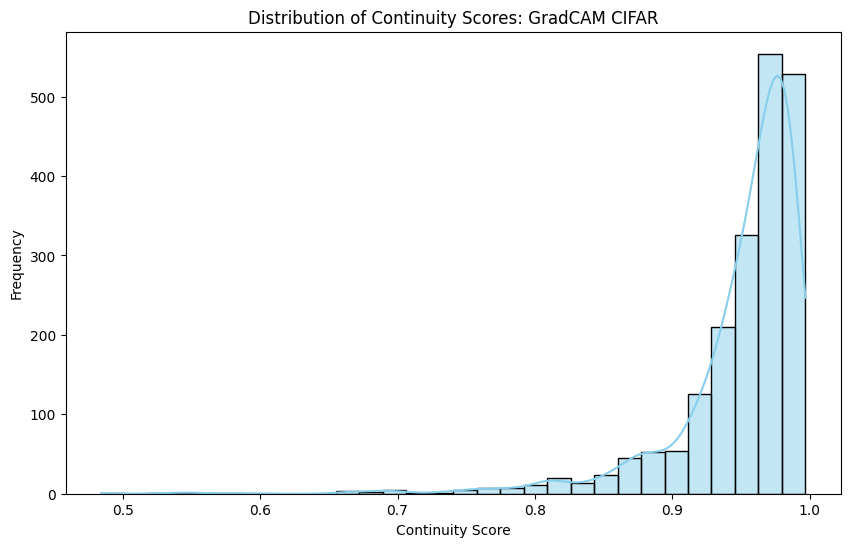

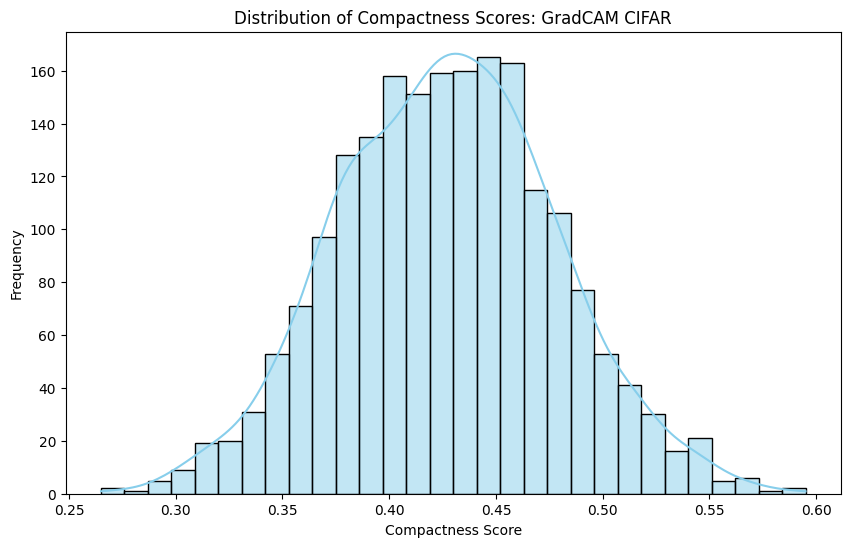

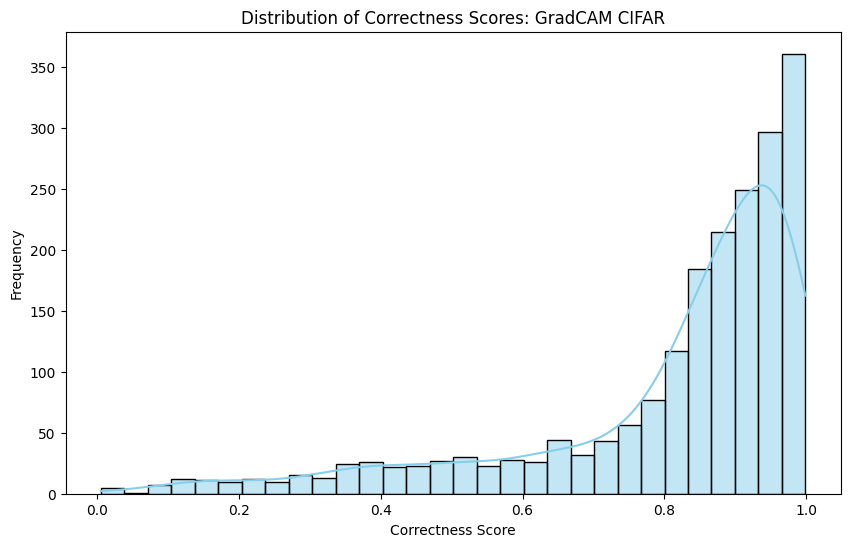

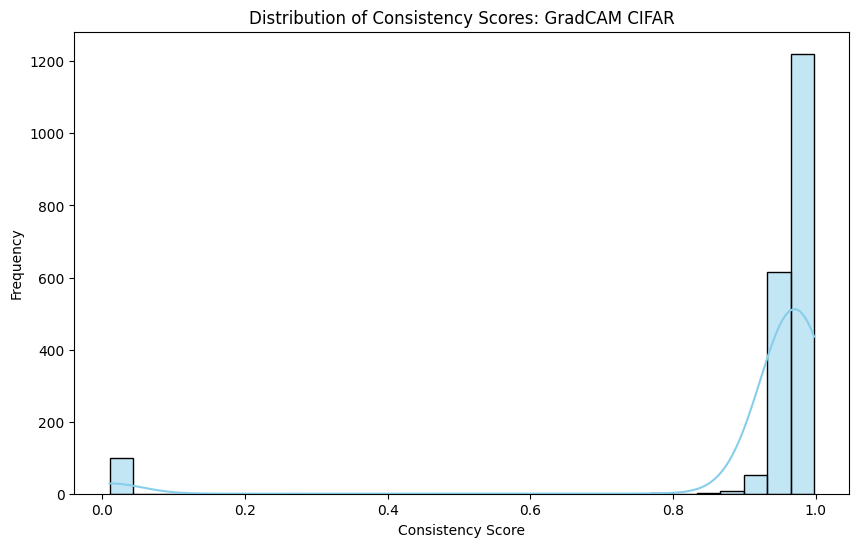

SHAP


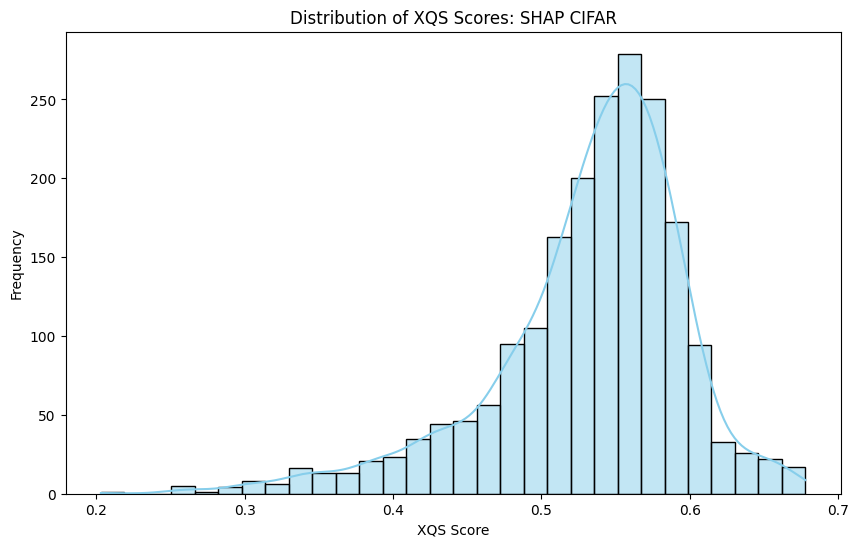

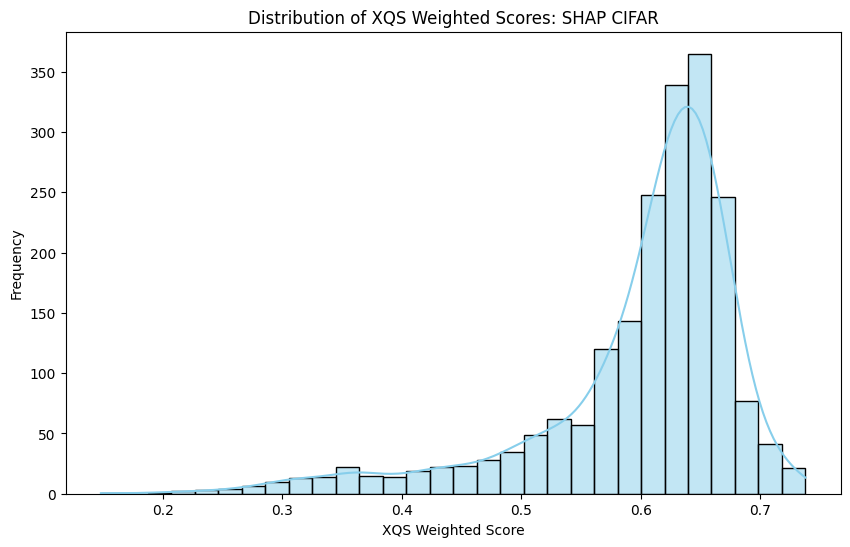

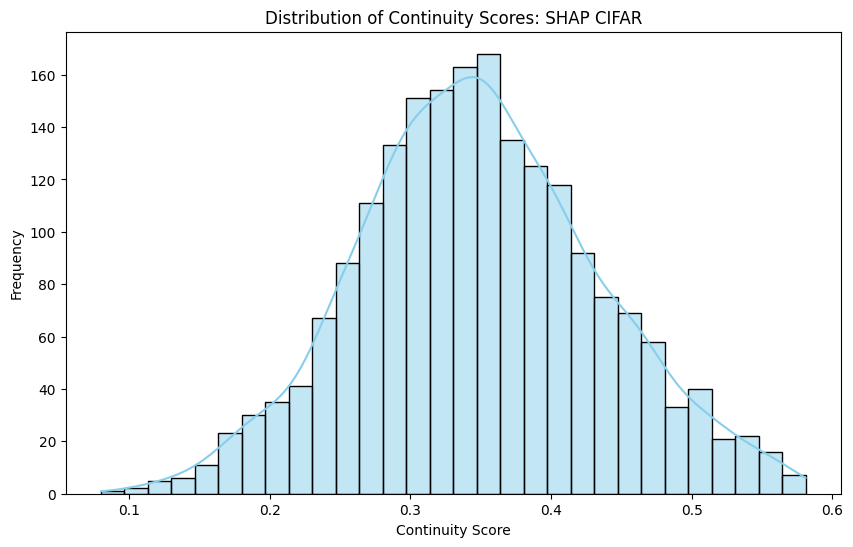

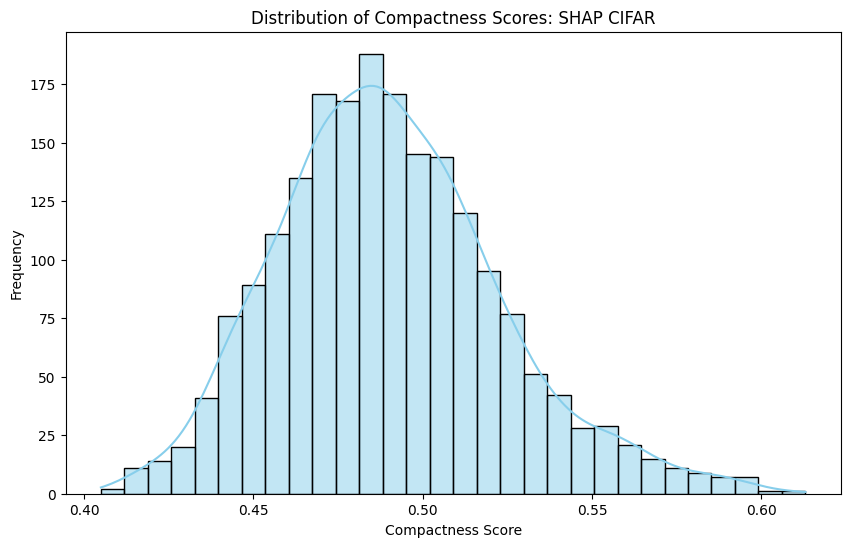

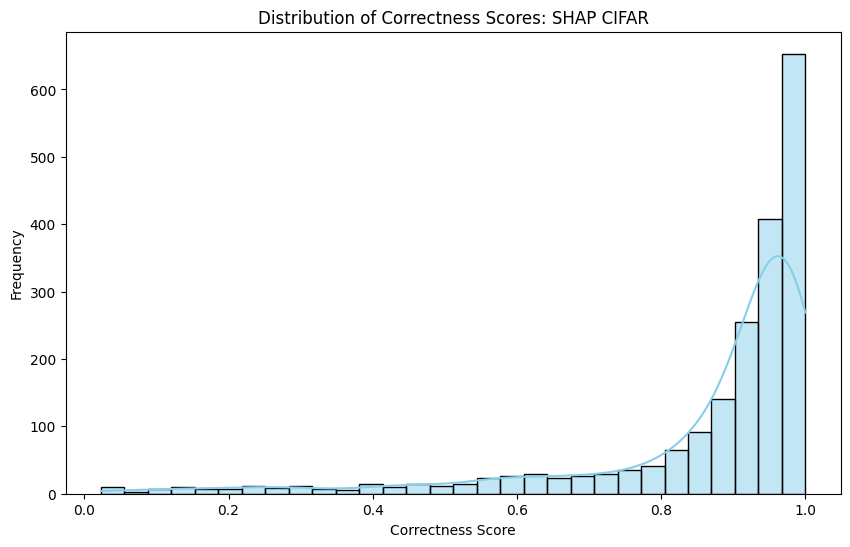

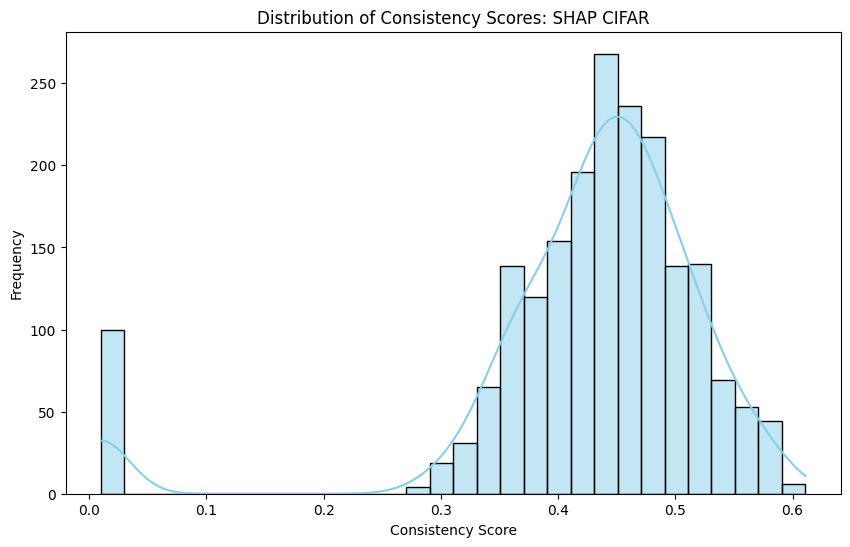

In [21]:
for df in [per_image_gradcam_cifar, per_image_shap_cifar]:
    print(df["XAI Method"].iloc[0])
    for metric in ["XQS", "XQS Weighted","Continuity", "Compactness", "Correctness", "Consistency"]:
        method = df["XAI Method"].iloc[0]
        plt.figure(figsize=(10, 6))
        sns.histplot(df[metric].to_numpy(), kde=True, bins=30, color='skyblue')
        plt.title(f'Distribution of {metric} Scores: {method} CIFAR')
        plt.xlabel(f'{metric} Score')
        plt.ylabel('Frequency')
        plt.show()

In [20]:
for df in [per_image_gradcam_cifar, per_image_shap_cifar]:
    print(df["XAI Method"].iloc[0])
    metrics=["XQS", "XQS Weighted","Continuity", "Compactness", "Correctness", "Consistency"]
    print(df[metrics].describe().T)
    print("----------------------------------------------------")

GradCAM
               count      mean       std    min     25%     50%    75%    max
XQS           2000.0  0.777322  0.079092  0.351  0.7530  0.8040  0.828  0.884
XQS Weighted  2000.0  0.796534  0.085511  0.342  0.7700  0.8270  0.853  0.903
Continuity    2000.0  0.950233  0.050462  0.484  0.9400  0.9650  0.980  0.997
Compactness   2000.0  0.426816  0.050962  0.265  0.3900  0.4270  0.461  0.595
Correctness   2000.0  0.811087  0.205765  0.005  0.7675  0.8855  0.950  0.999
Consistency   2000.0  0.921169  0.209813  0.010  0.9590  0.9700  0.981  0.998
----------------------------------------------------
SHAP
               count      mean       std    min    25%     50%    75%    max
XQS           2000.0  0.532214  0.065551  0.203  0.505  0.5445  0.574  0.678
XQS Weighted  2000.0  0.599510  0.087157  0.148  0.578  0.6245  0.653  0.738
Continuity    2000.0  0.348309  0.085743  0.080  0.291  0.3460  0.403  0.581
Compactness   2000.0  0.490029  0.032875  0.405  0.468  0.4870  0.509  0.613
Cor

### Baseline Metrics

In [7]:
cifar_metrics = aggregate_gradcam_cifar[["Cycle/CIFAR", "Accuracy", "Precision", "Recall", "F1"]].copy()
cifar_metrics["Accuracy"] = (100 * cifar_metrics["Accuracy"]).round(2)
cifar_metrics["Precision"] = (100 * cifar_metrics["Precision"]).round(2)
cifar_metrics["Recall"] = (100 * cifar_metrics["Recall"]).round(2)
cifar_metrics["F1"] = (100 * cifar_metrics["F1"]).round(2)

cifar_metrics.head()

,Cycle/CIFAR,Accuracy,Precision,Recall,F1
0,1,90.7,90.8,90.7,90.7
1,2,90.6,90.7,90.6,90.6
2,3,89.9,90.1,89.9,89.9
3,4,91.5,91.6,91.5,91.5
4,5,91.8,91.9,91.8,91.9


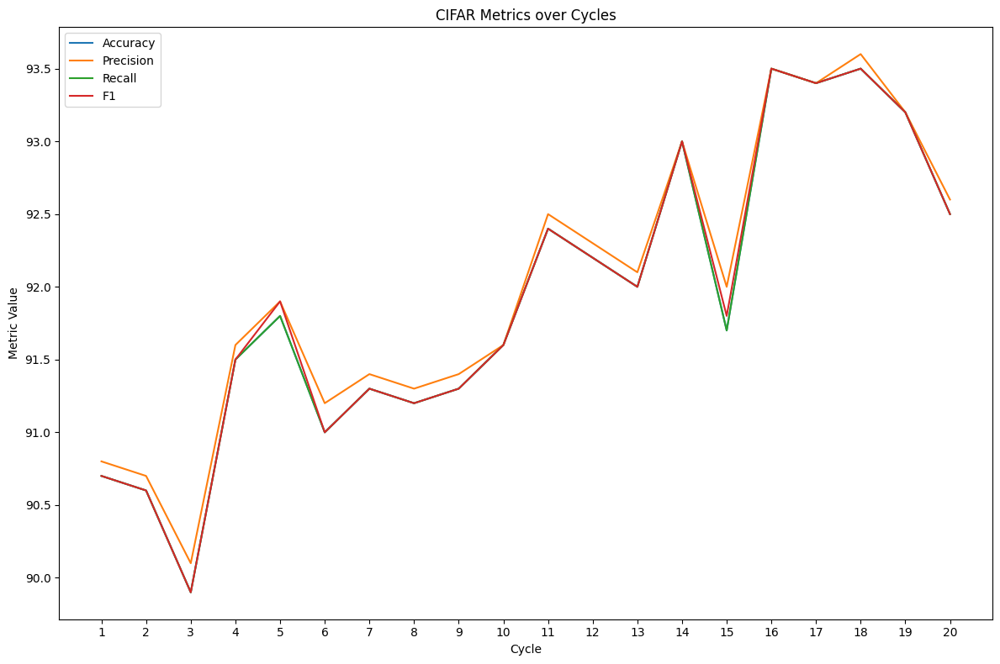

In [6]:
plt.figure(figsize=(12, 8))
metrics = ["Accuracy", "Precision", "Recall", "F1"]     
for metric in metrics:
    plt.plot(cifar_metrics["Cycle/CIFAR"], cifar_metrics[metric], label=metric)
plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("CIFAR Metrics over Cycles")
plt.legend()
# plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))
plt.tight_layout()
plt.show()


## Random Sampling

In [110]:
save_dir =Path( "./data/models/cifar/random_sampling")
random_sampling_cifar = pd.read_csv(save_dir/'eval_metrics.csv')
random_sampling_cifar["Accuracy"] = (100 * random_sampling_cifar["Accuracy"]).round(2)
random_sampling_cifar["Precision"] = (100 * random_sampling_cifar["Precision"]).round(2)
random_sampling_cifar["Recall"] = (100 * random_sampling_cifar["Recall"]).round(2)
random_sampling_cifar["F1"] = (100 * random_sampling_cifar["F1"]).round(2)



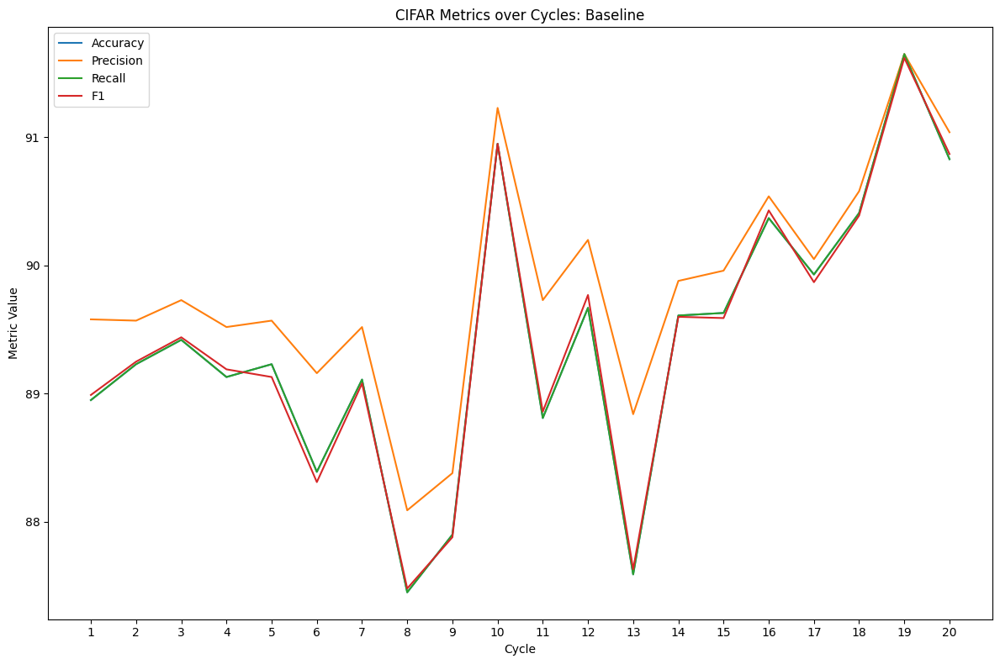

In [113]:
plt.figure(figsize=(12, 8))
metrics = ["Accuracy", "Precision", "Recall", "F1"]     
for metric in metrics:
    plt.plot(random_sampling_cifar["Cycle"], random_sampling_cifar[metric], label=metric)
plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("CIFAR Metrics over Cycles: Baseline")
plt.legend()
# plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))
plt.tight_layout()
plt.show()


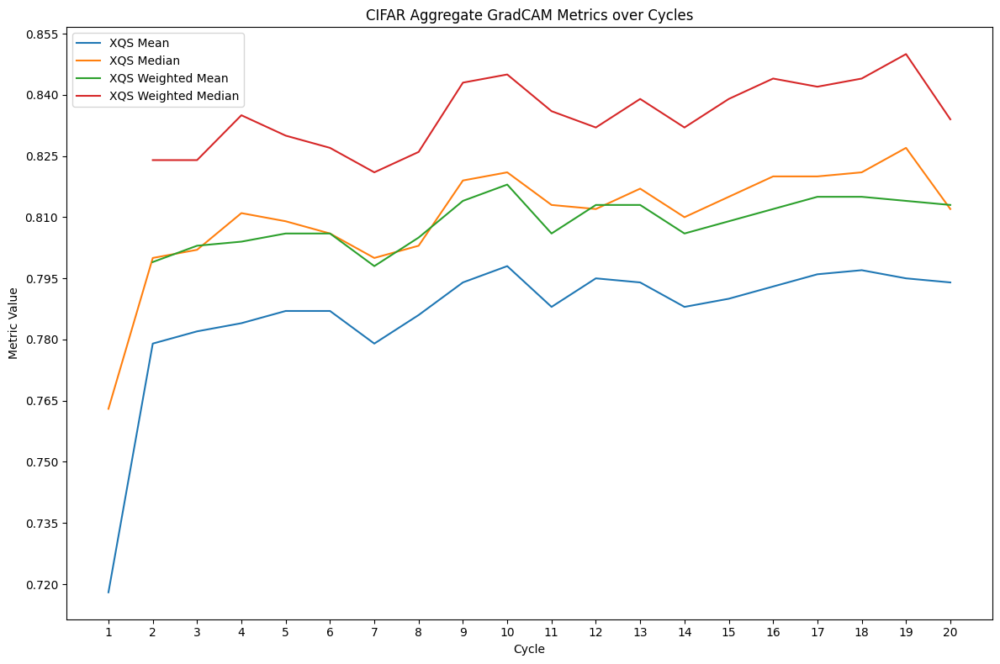

In [132]:
plt.figure(figsize=(12, 8))
metrics = ["XQS Mean", "XQS Median", "XQS Weighted Mean", "XQS Weighted Median"]

for metric in metrics:
    plt.plot(aggregate_gradcam_cifar["Cycle/CIFAR"], (aggregate_gradcam_cifar[metric]), label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("CIFAR Aggregate GradCAM Metrics over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()

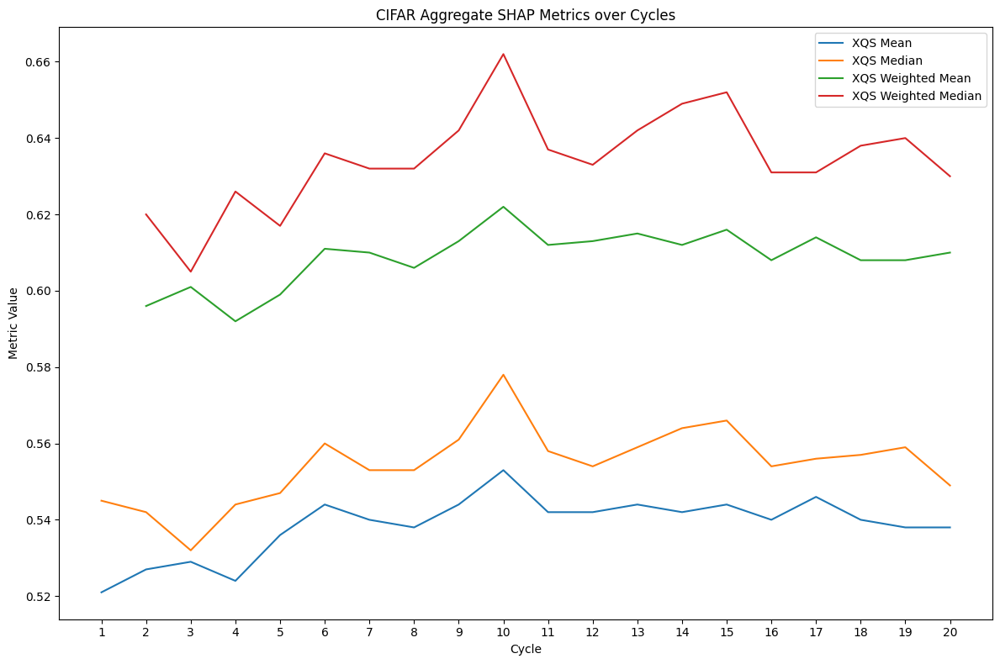

In [133]:
plt.figure(figsize=(12, 8))
metrics = ["XQS Mean", "XQS Median", "XQS Weighted Mean", "XQS Weighted Median"]

for metric in metrics:
    plt.plot(aggregate_shap_cifar["Cycle/CIFAR"], (aggregate_shap_cifar[metric]), label=metric)

plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("CIFAR Aggregate SHAP Metrics over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))

plt.tight_layout()
plt.show()

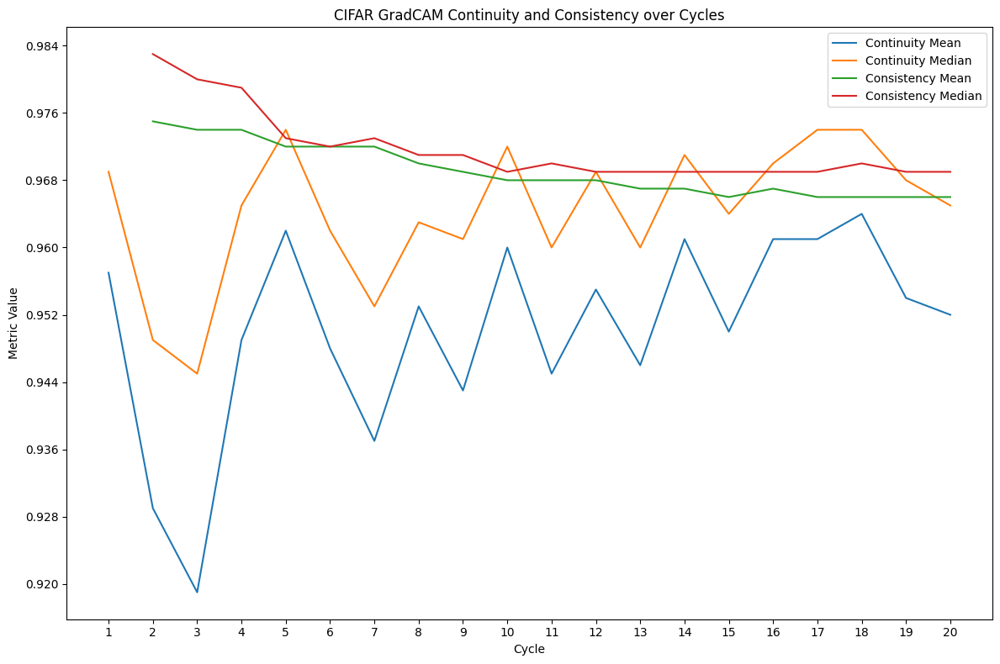

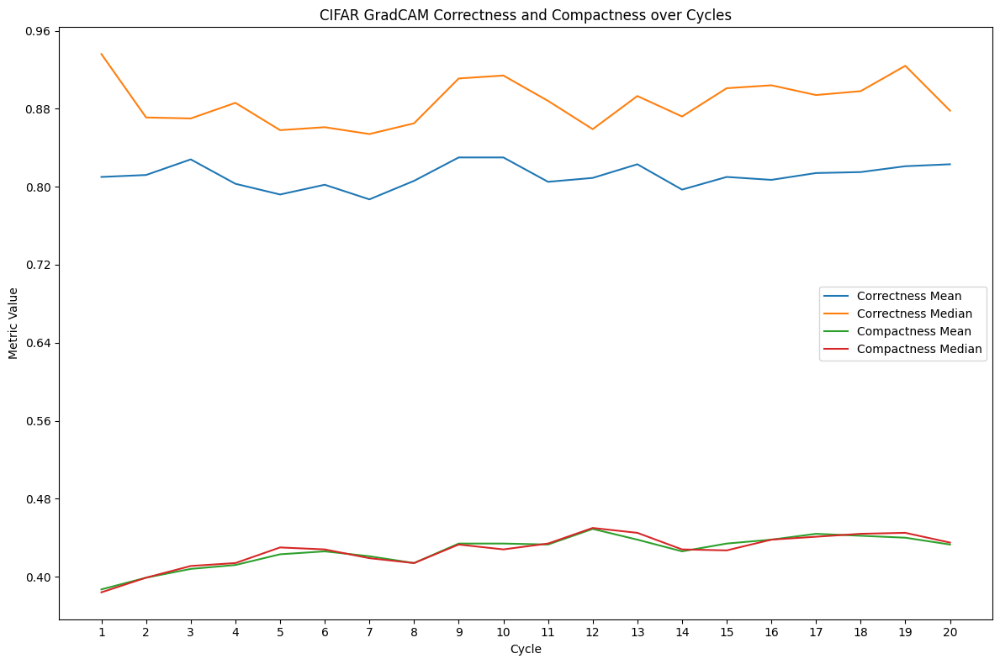

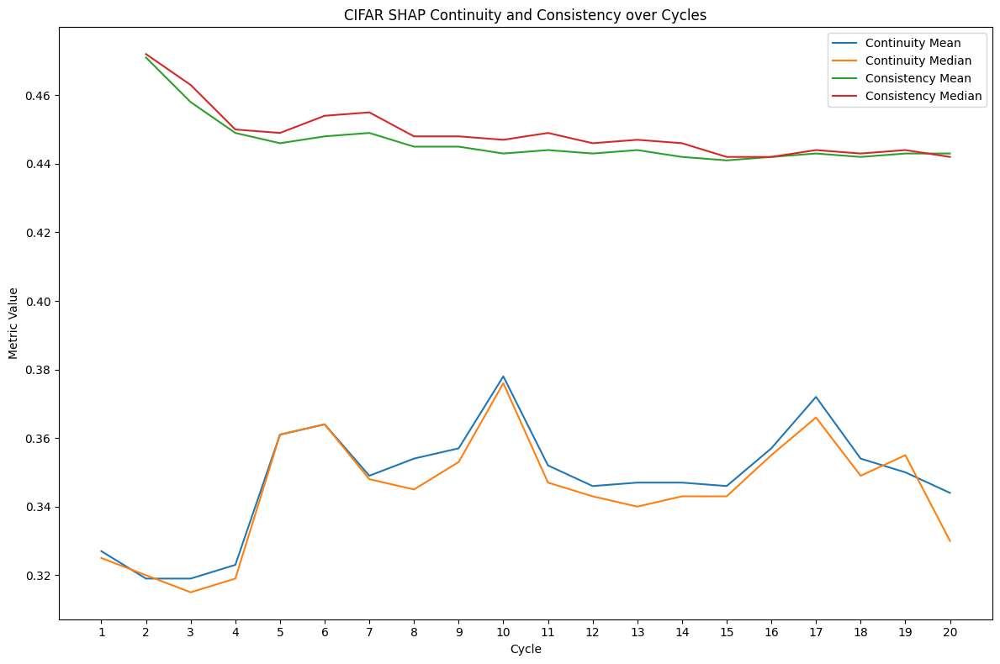

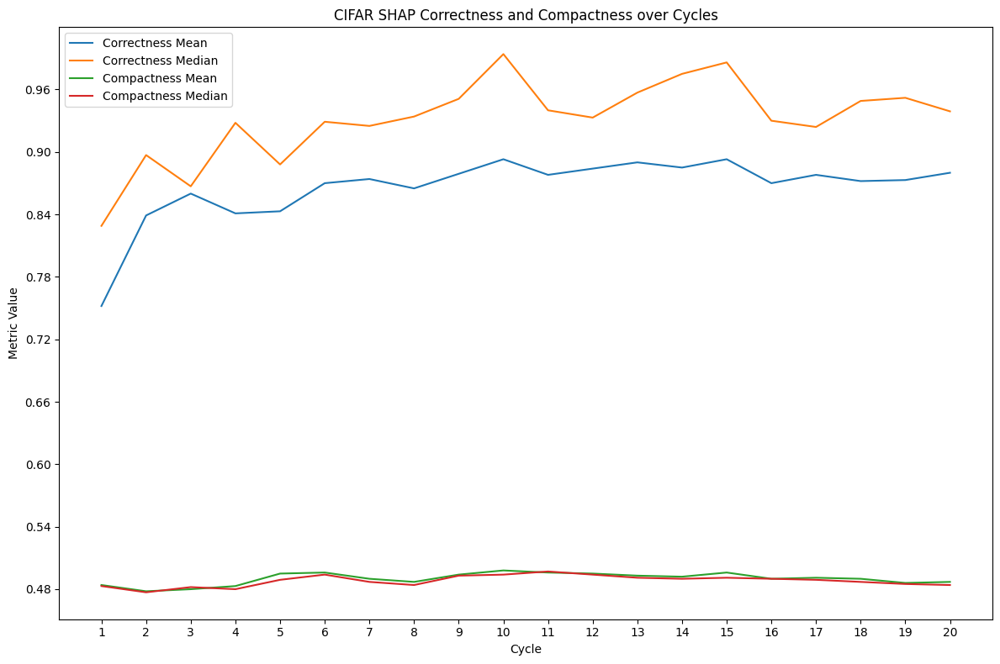

In [125]:
plt.figure(figsize=(12, 8))
metrics = ["Continuity Mean","Continuity Median", "Consistency Mean",  "Consistency Median" ]
for metric in metrics:
    plt.plot(aggregate_gradcam_cifar["Cycle/CIFAR"], (aggregate_gradcam_cifar[metric]), label=metric)  
plt.xlabel("Cycle")
plt.ylabel("Metric Value")  
plt.title("CIFAR GradCAM Continuity and Consistency over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
metrics = ["Correctness Mean","Correctness Median", "Compactness Mean","Compactness Median"]
for metric in metrics:
    plt.plot(aggregate_gradcam_cifar["Cycle/CIFAR"], (aggregate_gradcam_cifar[metric]), label=metric)
plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("CIFAR GradCAM Correctness and Compactness over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
metrics = ["Continuity Mean","Continuity Median","Consistency Mean",  "Consistency Median"  ]
for metric in metrics:
    plt.plot(aggregate_shap_cifar["Cycle/CIFAR"], (aggregate_shap_cifar[metric]), label=metric)
plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("CIFAR SHAP Continuity and Consistency over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
metrics = [ "Correctness Mean","Correctness Median","Compactness Mean","Compactness Median"]
for metric in metrics:
    plt.plot(aggregate_shap_cifar["Cycle/CIFAR"], (aggregate_shap_cifar[metric]), label=metric)
plt.xlabel("Cycle")
plt.ylabel("Metric Value")
plt.title("CIFAR SHAP Correctness and Compactness over Cycles")
plt.legend()
# plt.grid(True)
plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.xticks(range(1, 21))
plt.tight_layout()
plt.show()

### Correlation Analysis

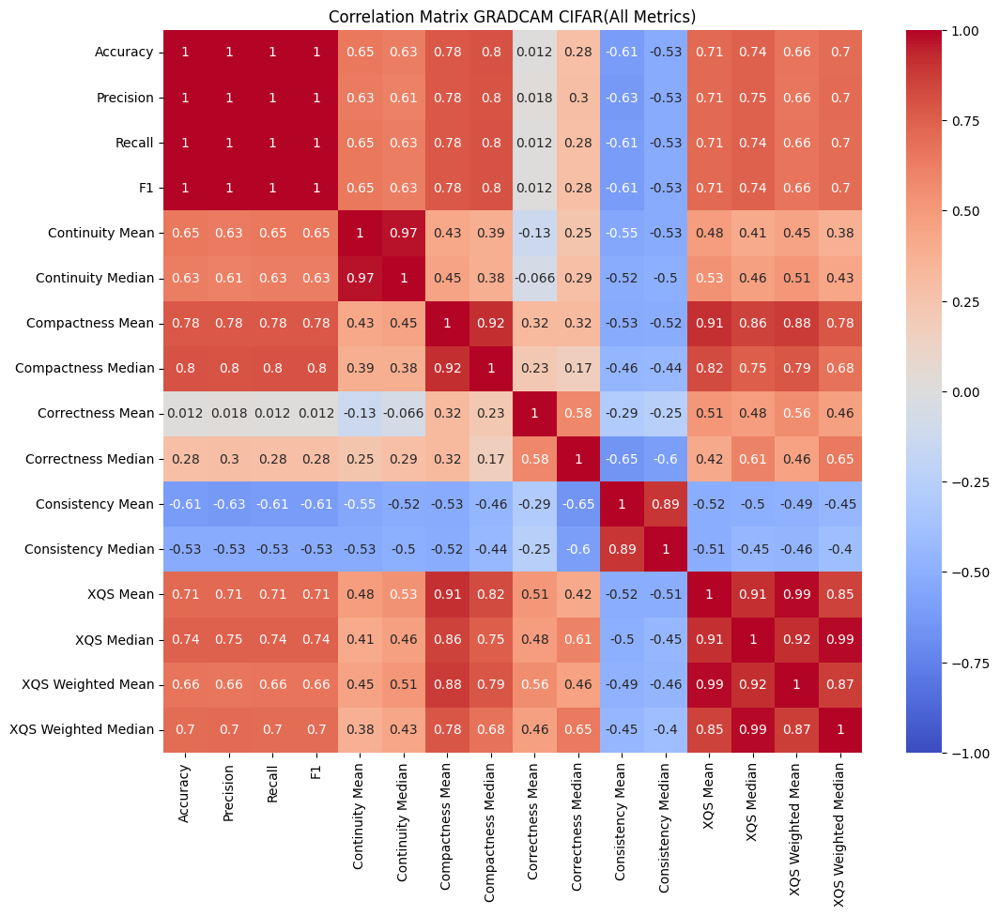

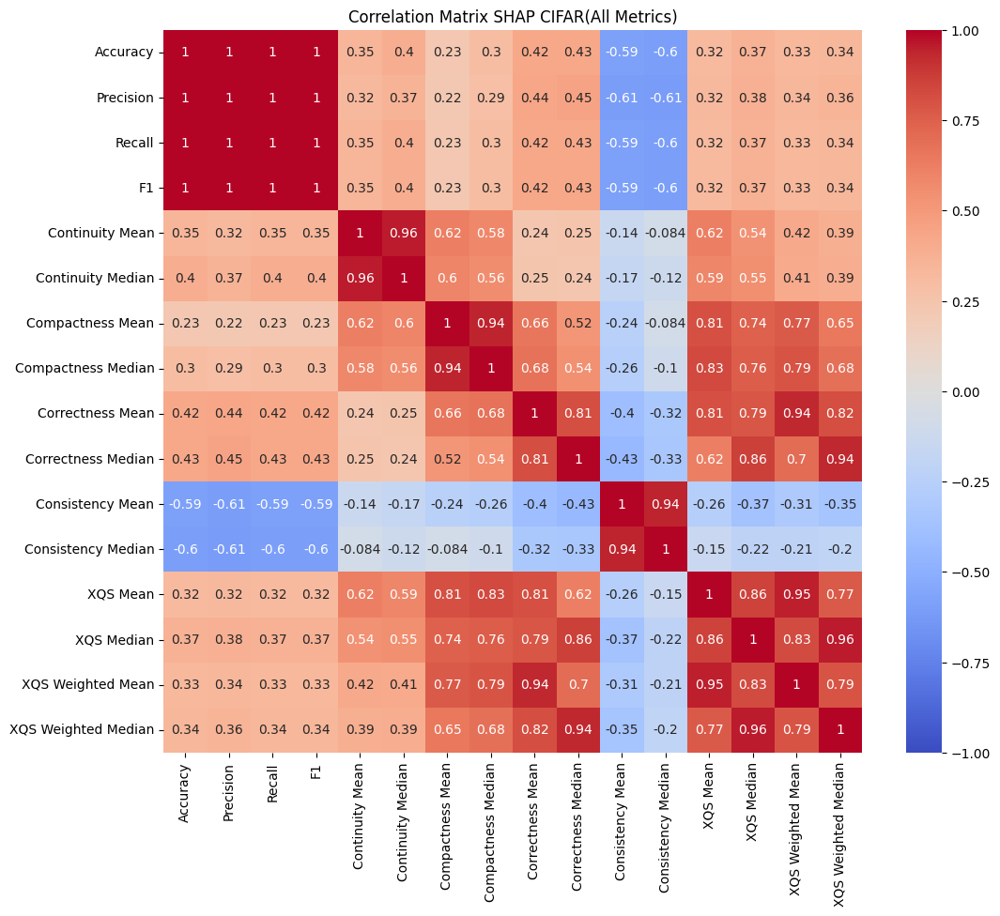

In [45]:
plt.figure(figsize=(12, 10))
sns.heatmap(aggregate_gradcam_cifar.drop(columns=["XAI Method", "Cycle/CIFAR"]).corr(method='spearman'), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix GRADCAM CIFAR(All Metrics)")
plt.show()

plt.figure(figsize=(12, 10))
sns.heatmap(aggregate_shap_cifar.drop(columns=["XAI Method", "Cycle/CIFAR"]).corr(method='spearman'), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix SHAP CIFAR(All Metrics)") 
plt.show()

In [19]:
import math
one = list(aggregate_gradcam_cifar.columns .drop(["XAI Method", "Cycle/CIFAR"]))
for i in one:
    for j in one:
        corr, p_value = spearmanr(aggregate_gradcam_cifar[i], aggregate_gradcam_cifar[j])
        # if p_value < 0.01 and p_value.round(4) != 0.0000:
        print(f"{i} vs. {j}: r={corr:.3f}, p={p_value:.4f}")

Accuracy vs. Accuracy: r=1.000, p=0.0000
Accuracy vs. Precision: r=0.998, p=0.0000
Accuracy vs. Recall: r=1.000, p=0.0000
Accuracy vs. F1: r=1.000, p=0.0000
Accuracy vs. Continuity Mean: r=0.653, p=0.0018
Accuracy vs. Continuity Median: r=0.631, p=0.0029
Accuracy vs. Compactness Mean: r=0.776, p=0.0001
Accuracy vs. Compactness Median: r=0.804, p=0.0000
Accuracy vs. Correctness Mean: r=0.012, p=0.9610
Accuracy vs. Correctness Median: r=0.284, p=0.2242
Accuracy vs. Consistency Mean: r=-0.614, p=0.0040
Accuracy vs. Consistency Median: r=-0.526, p=0.0173
Accuracy vs. XQS Mean: r=0.714, p=0.0004
Accuracy vs. XQS Median: r=0.743, p=0.0002
Accuracy vs. XQS Weighted Mean: r=0.665, p=0.0014
Accuracy vs. XQS Weighted Median: r=0.700, p=0.0006
Precision vs. Accuracy: r=0.998, p=0.0000
Precision vs. Precision: r=1.000, p=0.0000
Precision vs. Recall: r=0.998, p=0.0000
Precision vs. F1: r=0.998, p=0.0000
Precision vs. Continuity Mean: r=0.635, p=0.0027
Precision vs. Continuity Median: r=0.614, p=0.0

In [18]:
two = list(aggregate_shap_cifar.columns .drop(["XAI Method", "Cycle/CIFAR"]))
for i in two:
    for j in two: 
        corr, p_value = spearmanr(aggregate_shap_cifar[i], aggregate_shap_cifar[j])
        # if p_value < 0.01 and p_value.round(4) != 0.0000:
        print(f"{i} vs. {j}: r={corr:.3f}, p={p_value:.4f}")

Accuracy vs. Accuracy: r=1.000, p=0.0000
Accuracy vs. Precision: r=0.998, p=0.0000
Accuracy vs. Recall: r=1.000, p=0.0000
Accuracy vs. F1: r=1.000, p=0.0000
Accuracy vs. Continuity Mean: r=0.351, p=0.1293
Accuracy vs. Continuity Median: r=0.395, p=0.0844
Accuracy vs. Compactness Mean: r=0.230, p=0.3285
Accuracy vs. Compactness Median: r=0.298, p=0.2022
Accuracy vs. Correctness Mean: r=0.423, p=0.0632
Accuracy vs. Correctness Median: r=0.429, p=0.0592
Accuracy vs. Consistency Mean: r=-0.593, p=0.0059
Accuracy vs. Consistency Median: r=-0.601, p=0.0050
Accuracy vs. XQS Mean: r=0.319, p=0.1703
Accuracy vs. XQS Median: r=0.369, p=0.1092
Accuracy vs. XQS Weighted Mean: r=0.332, p=0.1528
Accuracy vs. XQS Weighted Median: r=0.340, p=0.1423
Precision vs. Accuracy: r=0.998, p=0.0000
Precision vs. Precision: r=1.000, p=0.0000
Precision vs. Recall: r=0.998, p=0.0000
Precision vs. F1: r=0.998, p=0.0000
Precision vs. Continuity Mean: r=0.321, p=0.1679
Precision vs. Continuity Median: r=0.366, p=0.1

### Experiments

In [22]:
save_dir =Path( "./data/tables/cifar/two/experiments/")
continuity_exp_1_cifar = pd.read_csv(save_dir/'continuity_exp_1.csv')
continuity_exp_2_cifar = pd.read_csv(save_dir/'continuity_exp_2.csv')
continuity_exp_3_cifar = pd.read_csv(save_dir/'continuity_exp_3.csv')
continuity_exp_4_cifar = pd.read_csv(save_dir/'continuity_exp_4.csv')
correctness_exp_1_cifar = pd.read_csv(save_dir/'correctness_exp_1.csv')
correctness_exp_2_cifar = pd.read_csv(save_dir/'correctness_exp_2.csv')
correctness_exp_3_cifar = pd.read_csv(save_dir/'correctness_exp_3.csv')
correctness_exp_4_cifar = pd.read_csv(save_dir/'correctness_exp_4.csv')
consistency_exp_1_cifar = pd.read_csv(save_dir/'consistency_exp_1.csv')
consistency_exp_2_cifar = pd.read_csv(save_dir/'consistency_exp_2.csv')

In [23]:
lis = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
for i in [continuity_exp_1_cifar,continuity_exp_2_cifar, continuity_exp_3_cifar, continuity_exp_4_cifar]:
    df = i
    df["Baseline Mean Gradcam"] = aggregate_gradcam_cifar["Continuity Mean"]
    df["Baseline Median Gradcam"] = aggregate_gradcam_cifar["Continuity Median"]
    df["Baseline Mean SHAP"] = aggregate_shap_cifar["Continuity Mean"]
    df["Baseline Median SHAP"] = aggregate_shap_cifar["Continuity Median"]
    df["cycle"] = lis

for i in [correctness_exp_1_cifar,correctness_exp_2_cifar, correctness_exp_3_cifar, correctness_exp_4_cifar]:
    df = i
    df["Baseline Mean Gradcam"] = aggregate_gradcam_cifar["Correctness Mean"]
    df["Baseline Median Gradcam"] = aggregate_gradcam_cifar["Correctness Median"]
    df["Baseline Mean SHAP"] = aggregate_shap_cifar["Correctness Mean"]
    df["Baseline Median SHAP"] = aggregate_shap_cifar["Correctness Median"]
    df["cycle"] = lis

for i in [consistency_exp_1_cifar, consistency_exp_2_cifar]:
    df = i
    df["Baseline Mean Gradcam"] = aggregate_gradcam_cifar["Consistency Mean"]
    df["Baseline Median Gradcam"] = aggregate_gradcam_cifar["Consistency Median"]
    df["Baseline Mean SHAP"] = aggregate_shap_cifar["Consistency Mean"]
    df["Baseline Median SHAP"] = aggregate_shap_cifar["Consistency Median"]
    df["cycle"] = lis

## MAD & RMSE

In [24]:
for df in [continuity_exp_1_cifar, continuity_exp_2_cifar, continuity_exp_3_cifar, continuity_exp_4_cifar]:
    print(f"Petrubution: {df.iloc[0][0]}")
    print("MEAN VALUES")
    mad = np.mean(np.abs(df["Baseline Mean SHAP"] - df["Continuity Mean Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean SHAP"] - df["Continuity Mean Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Mean Gradcam"] - df["Continuity Mean Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean Gradcam"] - df["Continuity Mean Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")

    print("MEDIAN VALUES")
    mad = np.mean(np.abs(df["Baseline Median SHAP"] - df["Continuity Median Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Median SHAP"] - df["Continuity Median Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")  
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Median Gradcam"] - df["Continuity Median Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Median Gradcam"] - df["Continuity Median Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")
    print("----------------------------------------------------")


Petrubution: 5.0
MEAN VALUES
Mean Absolute Difference SHAP: 0.0449
Root Mean Square Error SHAP: 0.0452
Mean Absolute Difference GradCAM: 0.0106
Root Mean Square Error GradCAM: 0.0110
MEDIAN VALUES
Mean Absolute Difference SHAP: 0.0475
Root Mean Square Error SHAP: 0.0481
Mean Absolute Difference GradCAM: 0.0082
Root Mean Square Error GradCAM: 0.0085
----------------------------------------------------
Petrubution: 15.0
MEAN VALUES
Mean Absolute Difference SHAP: 0.0292
Root Mean Square Error SHAP: 0.0295
Mean Absolute Difference GradCAM: 0.0177
Root Mean Square Error GradCAM: 0.0180
MEDIAN VALUES
Mean Absolute Difference SHAP: 0.0299
Root Mean Square Error SHAP: 0.0311
Mean Absolute Difference GradCAM: 0.0155
Root Mean Square Error GradCAM: 0.0162
----------------------------------------------------
Petrubution: pearson
MEAN VALUES
Mean Absolute Difference SHAP: 0.0784
Root Mean Square Error SHAP: 0.0792
Mean Absolute Difference GradCAM: 0.0019
Root Mean Square Error GradCAM: 0.0024
MEDI

/tmp/ipykernel_3190/1567501375.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Petrubution: {df.iloc[0][0]}")


In [134]:
for df in [correctness_exp_1_cifar, correctness_exp_2_cifar, correctness_exp_3_cifar, correctness_exp_4_cifar]:
    print(f"Petrubution: {df.iloc[0][0]}")
    print("MEAN VALUES")
    mad = np.mean(np.abs(df["Baseline Mean SHAP"] - df["Correctness Mean Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean SHAP"] - df["Correctness Mean Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Mean Gradcam"] - df["Correctness Mean Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean Gradcam"] - df["Correctness Mean Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")

    print("MEDIAN VALUES")
    mad = np.mean(np.abs(df["Baseline Median SHAP"] - df["Correctness Median Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Median SHAP"] - df["Correctness Median Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")  
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Median Gradcam"] - df["Correctness Median Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Median Gradcam"] - df["Correctness Median Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")
    print("----------------------------------------------------")

Petrubution: 56.0
MEAN VALUES
Mean Absolute Difference SHAP: 0.0011
Root Mean Square Error SHAP: 0.0016
Mean Absolute Difference GradCAM: 0.0008
Root Mean Square Error GradCAM: 0.0009
MEDIAN VALUES
Mean Absolute Difference SHAP: 0.0026
Root Mean Square Error SHAP: 0.0039
Mean Absolute Difference GradCAM: 0.0009
Root Mean Square Error GradCAM: 0.0010
----------------------------------------------------
Petrubution: 224.0
MEAN VALUES
Mean Absolute Difference SHAP: 0.0015
Root Mean Square Error SHAP: 0.0017
Mean Absolute Difference GradCAM: 0.0012
Root Mean Square Error GradCAM: 0.0013
MEDIAN VALUES
Mean Absolute Difference SHAP: 0.0038
Root Mean Square Error SHAP: 0.0071
Mean Absolute Difference GradCAM: 0.0019
Root Mean Square Error GradCAM: 0.0020
----------------------------------------------------
Petrubution: mean
MEAN VALUES
Mean Absolute Difference SHAP: 0.0780
Root Mean Square Error SHAP: 0.0820
Mean Absolute Difference GradCAM: 0.0498
Root Mean Square Error GradCAM: 0.0525
MEDIA

/tmp/ipykernel_2199/1593758702.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Petrubution: {df.iloc[0][0]}")


In [135]:
for df in [consistency_exp_1_cifar, consistency_exp_2_cifar]:
    print(f"Petrubution: {df.iloc[0][0]}")
    print("MEAN VALUES")
    mad = np.mean(np.abs(df["Baseline Mean SHAP"] - df["Consistency Mean Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean SHAP"] - df["Consistency Mean Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Mean Gradcam"] - df["Consistency Mean Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Mean Gradcam"] - df["Consistency Mean Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")

    print("MEDIAN VALUES")
    mad = np.mean(np.abs(df["Baseline Median SHAP"] - df["Consistency Median Shap"]))
    rmse = np.sqrt(np.mean((df["Baseline Median SHAP"] - df["Consistency Median Shap"])**2))
    print(f"Mean Absolute Difference SHAP: {mad:.4f}")  
    print(f"Root Mean Square Error SHAP: {rmse:.4f}")

    mad = np.mean(np.abs(df["Baseline Median Gradcam"] - df["Consistency Median Gradcam"]))
    rmse = np.sqrt(np.mean((df["Baseline Median Gradcam"] - df["Consistency Median Gradcam"])**2))
    print(f"Mean Absolute Difference GradCAM: {mad:.4f}")
    print(f"Root Mean Square Error GradCAM: {rmse:.4f}")
    print("----------------------------------------------------")

Petrubution: pearson
MEAN VALUES
Mean Absolute Difference SHAP: 0.0203
Root Mean Square Error SHAP: 0.0229
Mean Absolute Difference GradCAM: 0.0056
Root Mean Square Error GradCAM: 0.0062
MEDIAN VALUES
Mean Absolute Difference SHAP: 0.0172
Root Mean Square Error SHAP: 0.0207
Mean Absolute Difference GradCAM: 0.0056
Root Mean Square Error GradCAM: 0.0061
----------------------------------------------------
Petrubution: kendall
MEAN VALUES
Mean Absolute Difference SHAP: 0.1328
Root Mean Square Error SHAP: 0.1362
Mean Absolute Difference GradCAM: 0.0951
Root Mean Square Error GradCAM: 0.0976
MEDIAN VALUES
Mean Absolute Difference SHAP: 0.1343
Root Mean Square Error SHAP: 0.1378
Mean Absolute Difference GradCAM: 0.0965
Root Mean Square Error GradCAM: 0.0990
----------------------------------------------------


/tmp/ipykernel_2199/1883296276.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Petrubution: {df.iloc[0][0]}")


## Plot Experiments

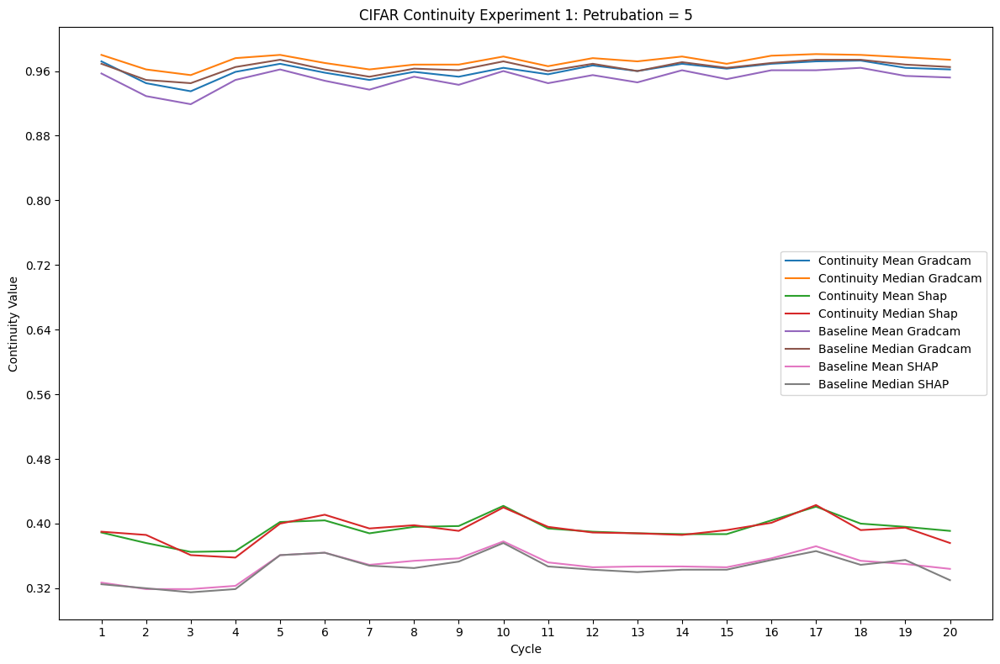

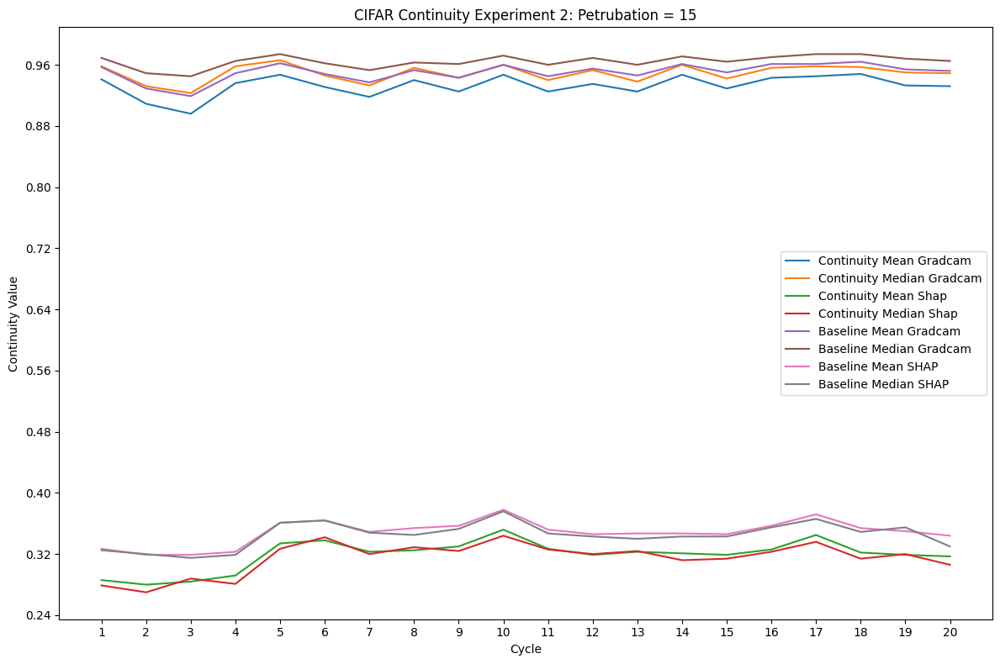

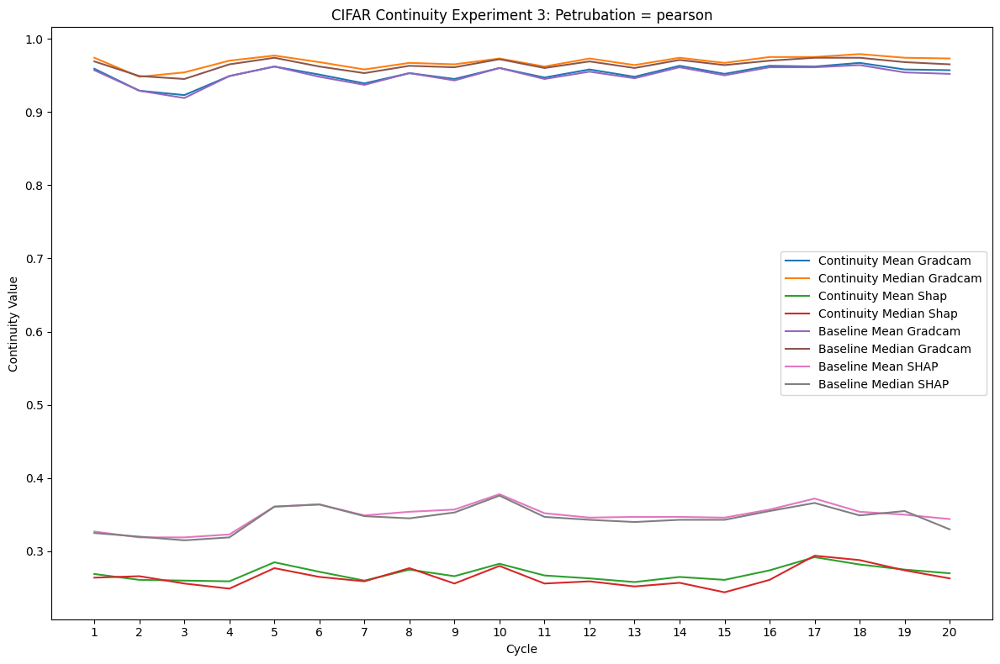

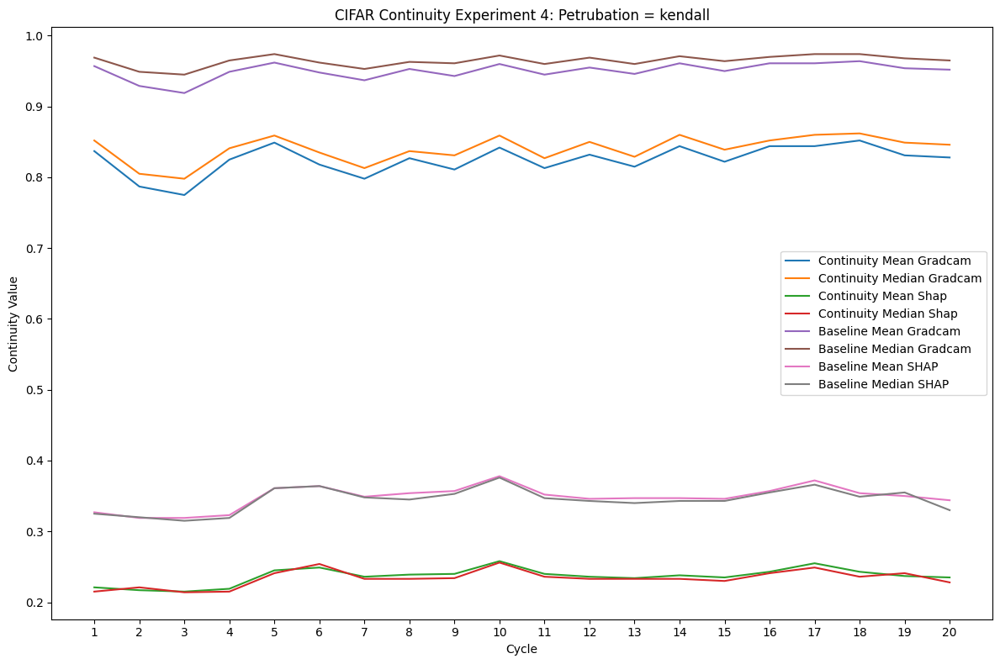

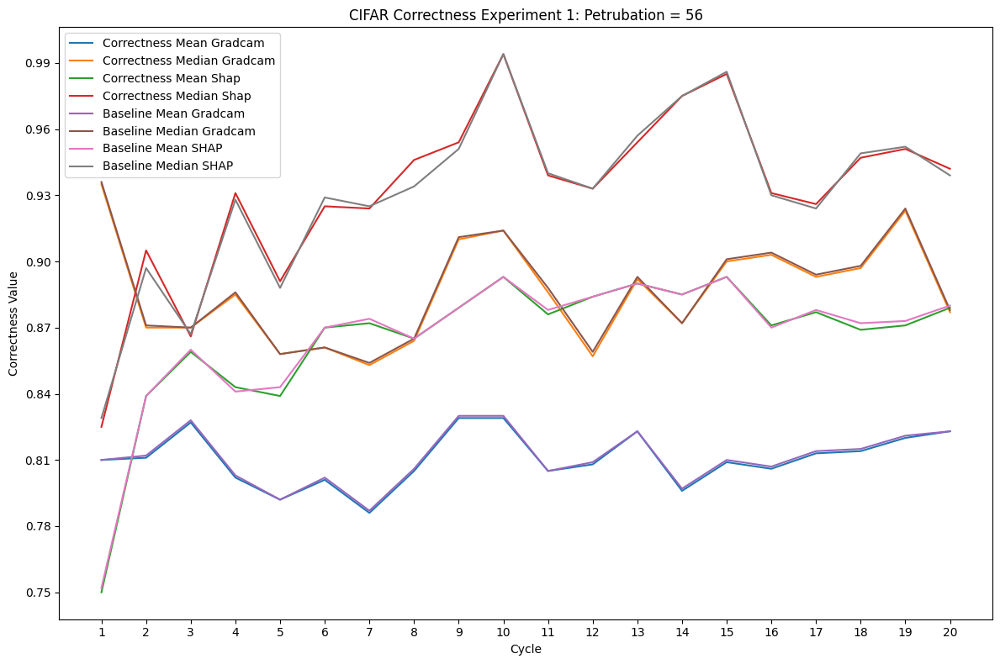

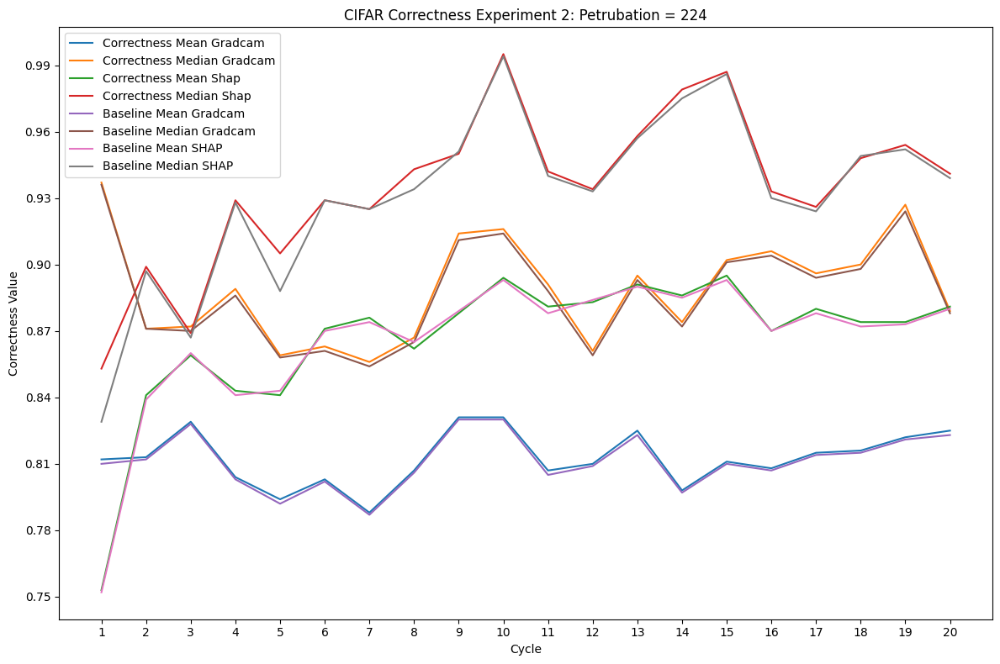

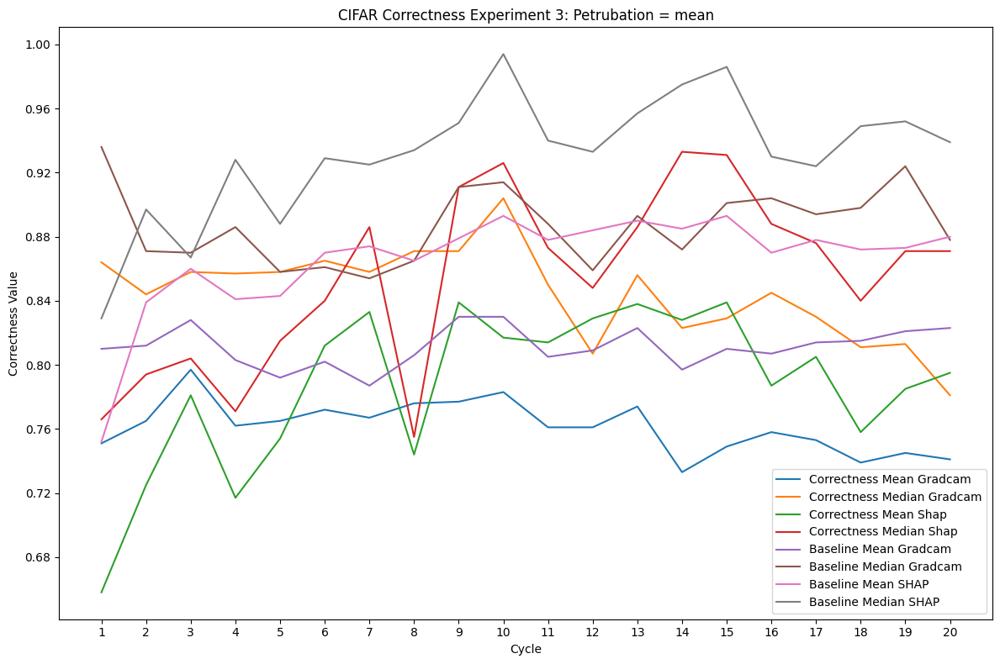

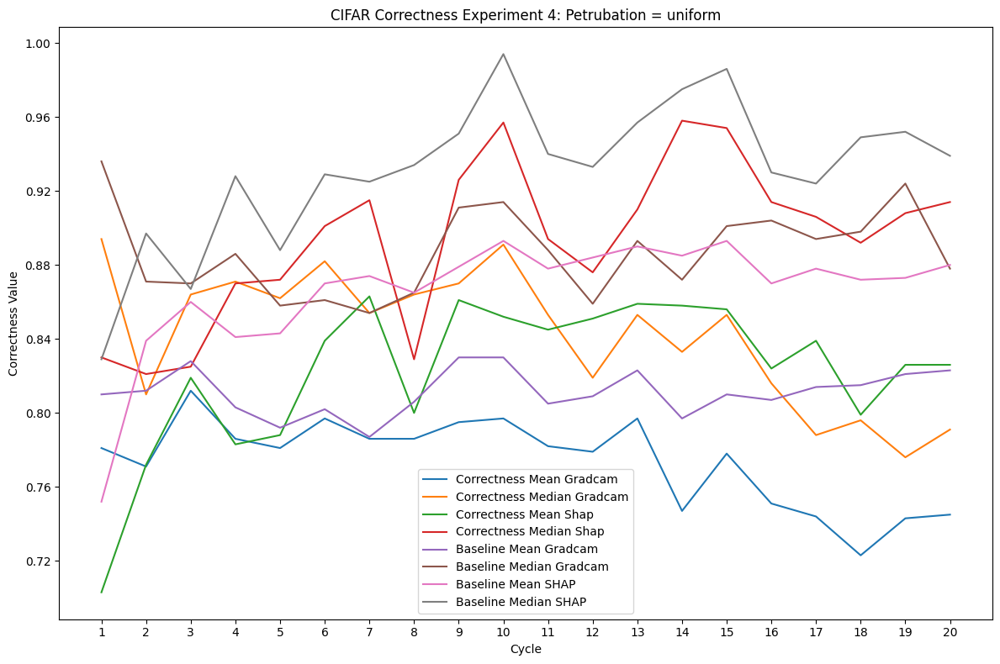

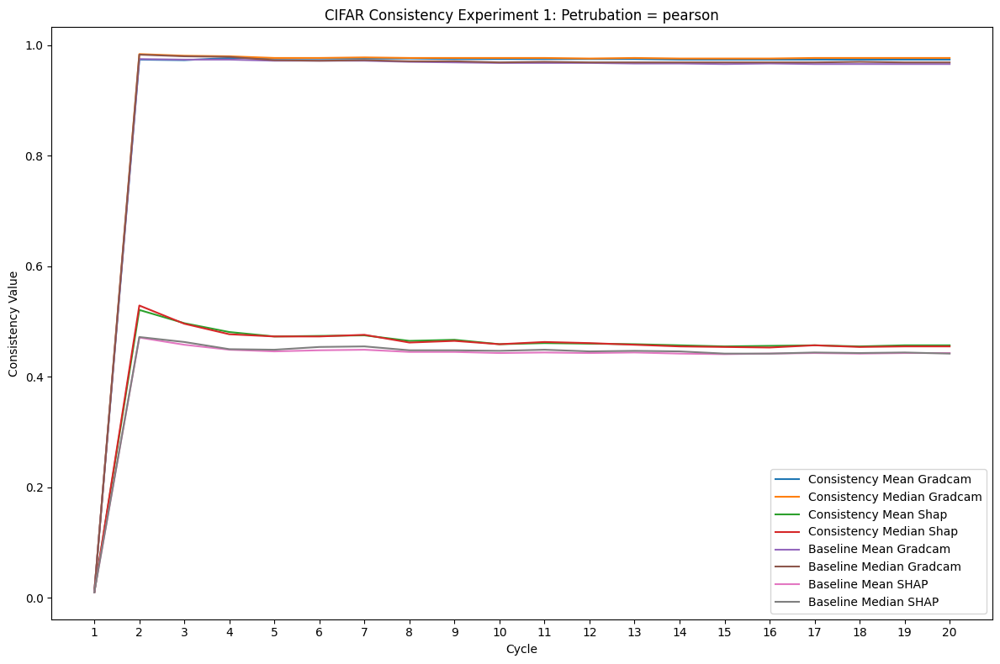

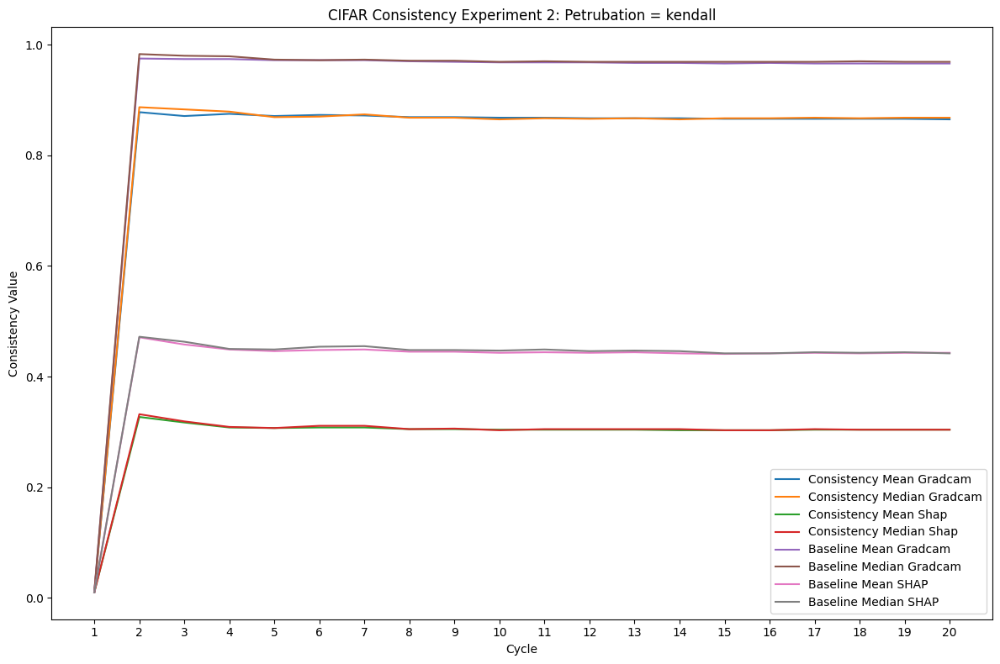

In [25]:
i=1
for df in [continuity_exp_1_cifar, continuity_exp_2_cifar, continuity_exp_3_cifar, continuity_exp_4_cifar]:
    plt.figure(figsize=(12, 8))
    column_names = list(df.columns)
    one = column_names[0]
    column_names.pop(0)  # Remove the first element (index 0)
    column_names.pop(-1)  # Remove the last element
    for metric in column_names:
        plt.plot(df["cycle"], df[metric], label=metric)
    plt.xlabel("Cycle")
    plt.ylabel("Continuity Value")
    plt.title(f"CIFAR Continuity Experiment {i}: Petrubation = {df[one].iloc[0]}")
    plt.legend()
    plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    plt.xticks(range(1, 21))
    plt.tight_layout()
    plt.show()
    i = i+1

i = 1
for df in [correctness_exp_1_cifar, correctness_exp_2_cifar, correctness_exp_3_cifar, correctness_exp_4_cifar]:
    plt.figure(figsize=(12, 8))
    column_names = list(df.columns)
    one = column_names[0]
    column_names.pop(0)  # Remove the first element (index 0)
    column_names.pop(-1)  # Remove the last element
    for metric in column_names:
        plt.plot(df["cycle"], df[metric], label=metric)
    plt.xlabel("Cycle")
    plt.ylabel("Correctness Value")
    plt.title(f"CIFAR Correctness Experiment {i}: Petrubation = {df[one].iloc[0]}")
    plt.legend()
    plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    plt.xticks(range(1, 21))
    plt.tight_layout()
    plt.show()
    i = i+1

i = 1
for df in [consistency_exp_1_cifar, consistency_exp_2_cifar]:
    plt.figure(figsize=(12, 8))
    column_names = list(df.columns)
    one = column_names[0]
    column_names.pop(0)  # Remove the first element (index 0)
    column_names.pop(-1)  # Remove the last element
    for metric in column_names:
        plt.plot(df["cycle"], df[metric], label=metric)
    plt.xlabel("Cycle")
    plt.ylabel("Consistency Value")
    plt.title(f"CIFAR Consistency Experiment {i}: Petrubation = {df[one].iloc[0]}")
    plt.legend()
    # plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    plt.xticks(range(1, 21))
    plt.tight_layout()
    plt.show()
    i = i+1